In [1]:
!pip install scFates

In [2]:
import sys
!{sys.executable} -m pip -q install palantir fa2

In [3]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [3]:
adata = sc.read(r"/mnt/c/Users/Emil/10X/D20-3958_WT.csv", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-D20-3958_WT.h5ad


In [15]:
adata

AnnData object with n_obs × n_vars = 31053 × 2735

In [46]:
adata = adata.transpose()

In [4]:
adata.obs

""
Xkr4
Gm1992
Gm37381
Rp1
Sox17
...
AC168977.1
AC149090.1
CAAA01118383.1
Vmn2r122


In [45]:
adata1 = sc.read(r"/mnt/c/Users/Emil/10X/D20-3959_KO.csv", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-D20-3959_KO.h5ad


In [44]:
adata1 = adata1.transpose()

In [389]:
adata1.obs

,stage,leiden,IFN-response,Inflammatory,Proliferating,t,seg,edge,t_sd,milestones,Homeostatic,Proinflammatory
AAACCCACAGAGAATT,KO,13,0.016619,-0.442234,-0.010095,8.965843,5,72|35,3.318429e-02,31,1.070573,0.523609
AAACCCACATGACAAA,KO,3,-0.027325,-0.176920,-0.020592,8.962752,5,156|35,3.723109e-02,31,1.194278,0.380984
AAACCCAGTGGTCCCA,KO,17,-0.047759,0.812121,-0.051081,7.691786,8,27|44,8.881784e-16,27,-0.186340,0.322551
AAACGAAAGGTAACTA,KO,2,-0.131882,-0.280414,0.000000,8.963233,5,3|161,4.326737e-02,31,0.930427,0.687701
AAACGAAGTGATCGTT,KO,14,-0.098636,3.514537,0.000000,2.982156,6,172|85,1.371075e-01,81,0.090841,1.219178
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGTCTTGCAAG,KO,12,-0.024949,-0.155303,0.000000,0.010984,47,165|56,2.440010e-02,97,0.451536,0.614977
TTTGGTTCATAATCGC,KO,11,-0.125224,1.936538,-0.019630,7.112409,5,144|79,1.386781e-01,16,0.469665,1.148119
TTTGTTGAGATCCTAC,KO,10,-0.184177,-0.143361,-0.018342,8.965598,5,145|130,1.744644e-02,31,1.105028,0.587395
TTTGTTGAGGATTACA,KO,12,-0.088700,-0.304452,-0.013216,0.032009,47,18|174,6.151511e-02,97,0.478688,0.749730


In [22]:
adata.obs['stage'] = 'WT'

In [23]:
adata1.obs['stage'] = 'KO'


In [26]:
adataall.obs

,stage,batch
AAACCCAAGAGGACTC-0,WT,0
AAACGAAAGGGAGTTC-0,WT,0
AAACGCTAGGTAAAGG-0,WT,0
AAACGCTGTAGAGATT-0,WT,0
AAACGCTGTTTCTATC-0,WT,0
...,...,...
TTTGGAGTCTTGCAAG-1,KO,1
TTTGGTTCATAATCGC-1,KO,1
TTTGTTGAGATCCTAC-1,KO,1
TTTGTTGAGGATTACA-1,KO,1


In [66]:

adata1.obs_names_make_unique()


In [25]:
adataall = AnnData.concatenate(adata, adata1)

In [27]:
adata = adataall

In [68]:
sc.pp.filter_genes(adata1,min_cells=3)
sc.pp.normalize_total(adata1)
sc.pp.log1p(adata1,base=10)
sc.pp.highly_variable_genes(adata1)

ValueError: Bin edges must be unique: array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan]).
You can drop duplicate edges by setting the 'duplicates' kwarg

In [145]:

sc.pp.pca(adatamergedsubset)
pca_projections = pd.DataFrame(adatamergedsubset.obsm["X_pca"],index=adatamergedsubset.obs_names)

computing PCA
    with n_comps=50
    finished (0:00:02)


In [261]:
pca_projections = pd.DataFrame(adatamerged.obsm["X_pca"],index=adatamerged.obs_names)

In [284]:
pca_projections

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
AAACCTGTCATCGCTC-1_1-0,1.59,-0.69,0.72,-6.00,-2.86,-1.03,-2.03,2.05,-3.72,3.18,...,-0.32,2.71,1.80,0.44,3.87,5.26e-01,-0.32,2.86e+00,0.43,-1.93
AAACCTGTCGCGCCAA-1_1-0,0.48,-8.32,8.50,-6.48,7.88,-1.75,0.07,-0.81,-6.22,-1.22,...,-0.43,0.27,-0.50,-1.66,-0.71,-2.47e+00,-0.24,3.11e-01,2.06,-0.46
AAACGGGTCAGGATCT-1_1-0,-2.57,1.89,-1.03,1.39,-0.07,-3.40,0.86,0.35,-0.19,-1.00,...,-1.05,-1.47,-2.62,2.54,0.63,-4.69e-01,0.78,3.11e-03,-5.01,1.14
AAAGATGCATAGACTC-1_1-0,-3.82,2.26,-2.36,0.13,-1.08,-2.96,-0.53,1.31,-1.36,0.88,...,-0.76,-0.43,0.85,1.08,-1.94,-2.91e-01,0.40,1.20e+00,0.18,-2.06
AAAGCAACATCTACGA-1_1-0,-2.91,2.81,-2.26,0.85,-0.74,-2.51,0.29,1.40,-1.36,-0.41,...,-1.91,0.26,0.14,-0.16,1.23,5.86e-03,-0.50,-7.38e-01,-0.04,-0.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCCAGACGCTC-1_2-2,3.80,1.13,-1.45,-6.99,-4.36,-0.66,-1.76,2.51,-1.82,1.59,...,-0.36,-1.46,-1.20,-0.61,-0.66,-1.06e-01,-0.45,-1.99e+00,-0.43,0.56
TTTGCGCGTCTCTCGT-1_2-2,17.38,0.11,0.37,-13.89,-10.55,0.28,-0.77,-0.53,2.51,5.48,...,-1.79,-2.20,0.15,0.71,-0.56,2.07e+00,2.21,-4.98e-01,0.84,-1.37
TTTGCGCTCAACCAAC-1_2-2,-3.81,1.22,-1.93,2.27,-0.19,-3.60,0.11,-1.21,0.62,0.06,...,2.29,-0.02,-0.41,0.83,0.19,2.59e-02,0.03,-6.49e-01,0.26,1.08
TTTGGTTGTAAGAGAG-1_2-2,-3.96,1.02,-1.12,2.16,0.07,-1.05,1.14,-5.93,4.81,1.64,...,-0.26,-0.66,0.80,-1.04,-0.13,7.29e-01,0.90,1.48e-02,-1.47,-1.54


In [146]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [147]:
# generate neighbor draph in multiscale diffusion space
adatamergedsubset.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatamergedsubset,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


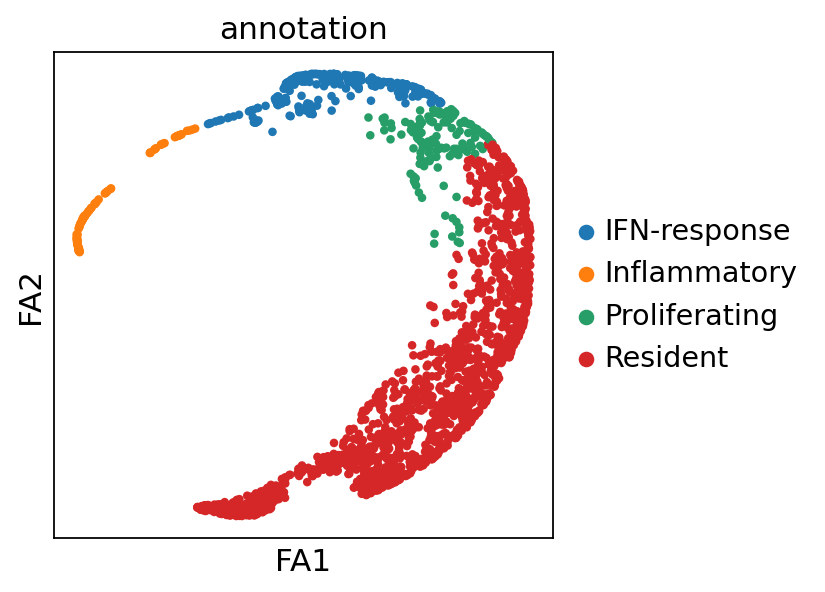

In [347]:
sc.set_figure_params()
sc.pl.draw_graph(adataWT,color=['annotation'], projection = '2d', layout = 'fa')

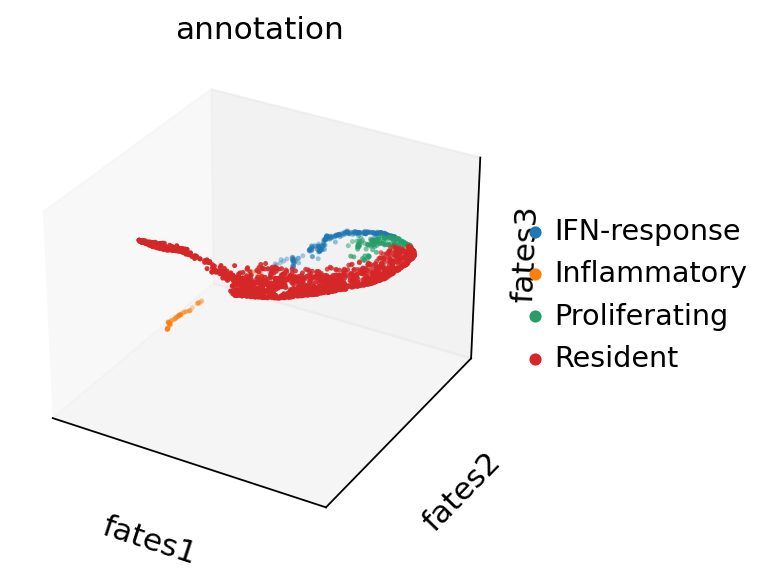

In [352]:
sc.set_figure_params()
sc.pl.embedding(adataWT,color=['annotation'], projection = '3d', basis = 'fates')

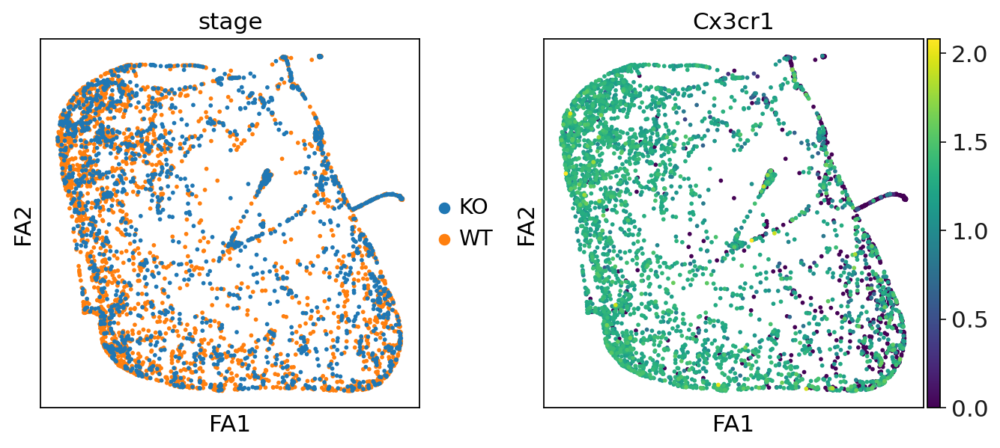

In [37]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=["stage",'Cx3cr1'])

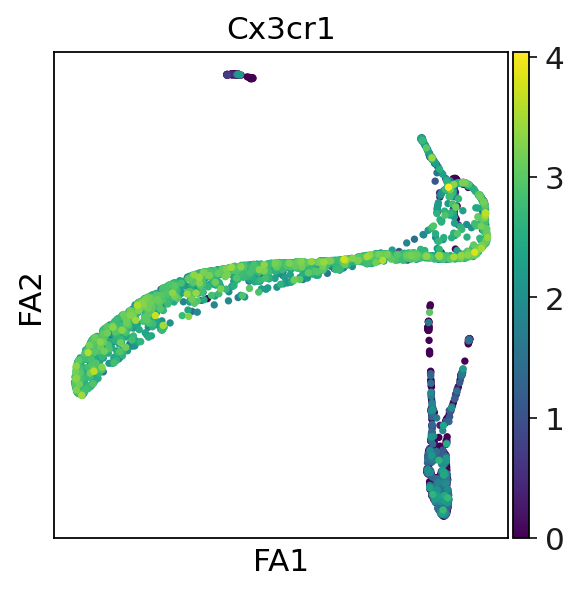

In [54]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['Cx3cr1'])

In [38]:
sc.pp.filter_genes(adata1,min_cells=3)
sc.pp.normalize_total(adata1)
sc.pp.log1p(adata1,base=10)
sc.pp.highly_variable_genes(adata1)

filtered out 16277 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


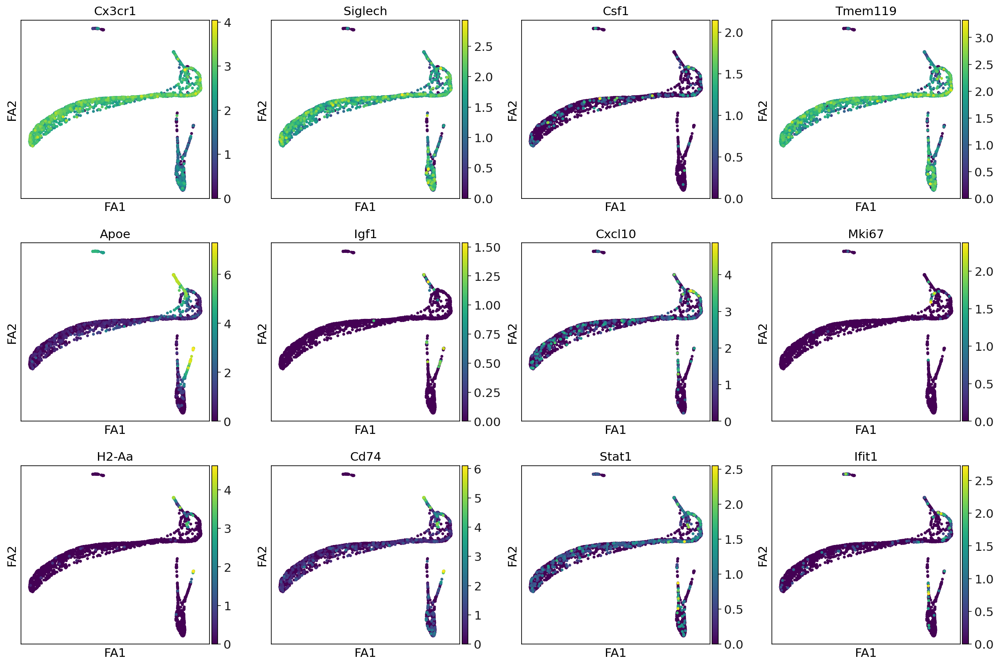

In [91]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['Cx3cr1','Siglech','Csf1','Tmem119','Apoe','Igf1','Cxcl10','Mki67','H2-Aa','Cd74','Stat1','Ifit1'])

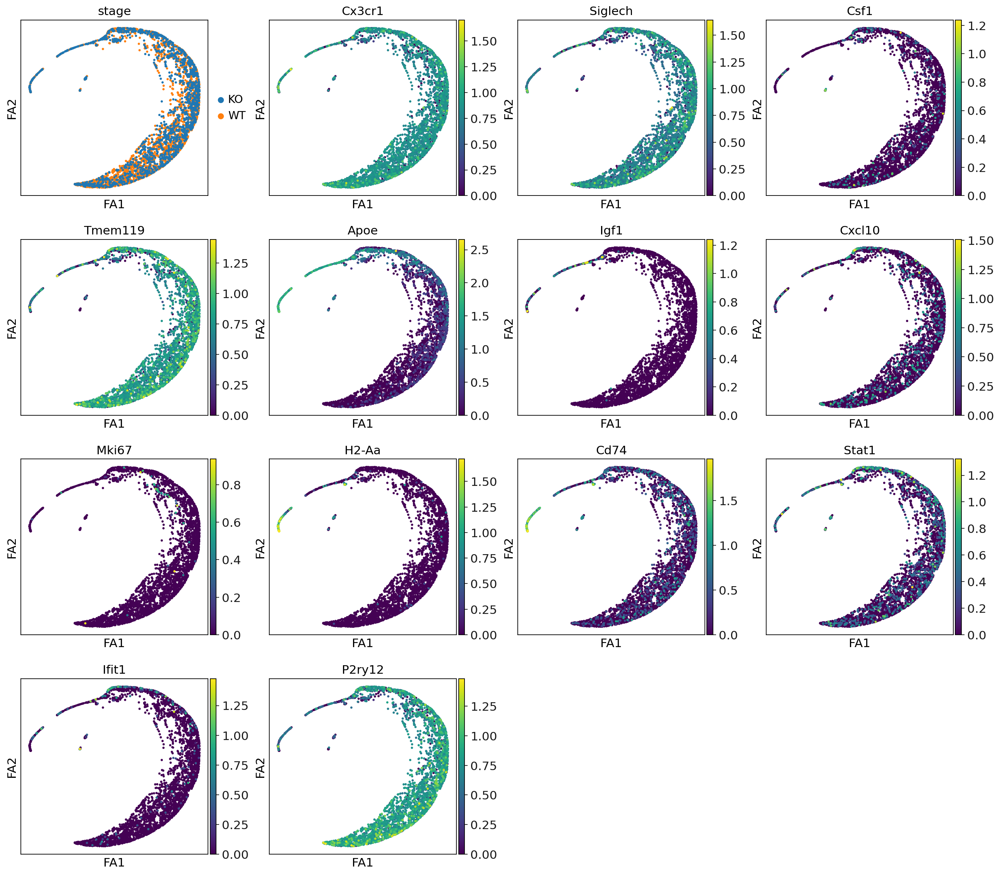

In [290]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=["stage",'Cx3cr1','Siglech','Csf1','Tmem119','Apoe','Igf1','Cxcl10','Mki67','H2-Aa','Cd74','Stat1','Ifit1','P2ry12'])

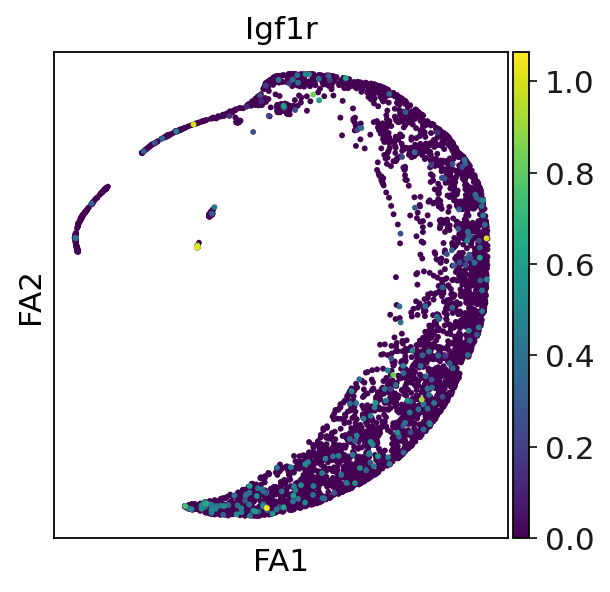

In [393]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=["Igf1r"])

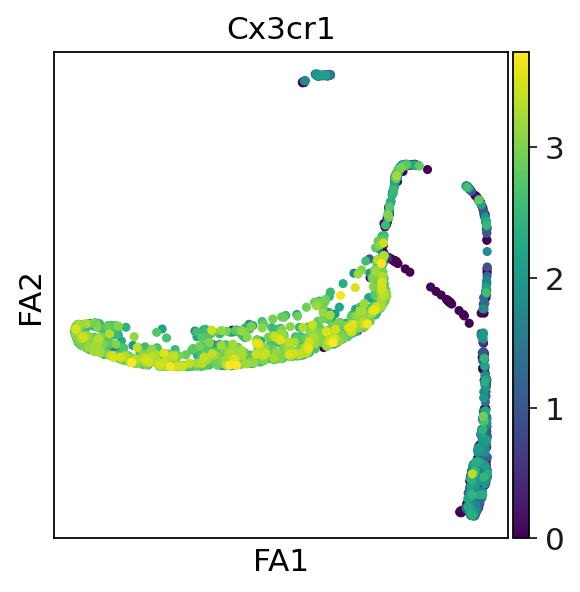

In [149]:
sc.set_figure_params()
sc.pl.draw_graph(adata1,color=['Cx3cr1'])

In [58]:
sc.pp.filter_genes(adataall,min_cells=3)
sc.pp.normalize_total(adataall)
sc.pp.log1p(adataall,base=10)
sc.pp.highly_variable_genes(adataall)
sc.pp.highly_variable_genes(adataall, n_top_genes=1500, flavor='cell_ranger')
sc.pp.pca(adataall)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


In [248]:
sc.pp.neighbors(adatasubset)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [249]:
sc.tl.umap(adatasubset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


In [250]:
pca_projections = pd.DataFrame(adatasubset.obsm["X_pca"],index=adatasubset.obs_names)

In [251]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [252]:
# generate neighbor draph in multiscale diffusion space
adatasubset.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset,n_neighbors=50,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [253]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adatasubset.obsm["X_pca2d"]=adatasubset.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:30)


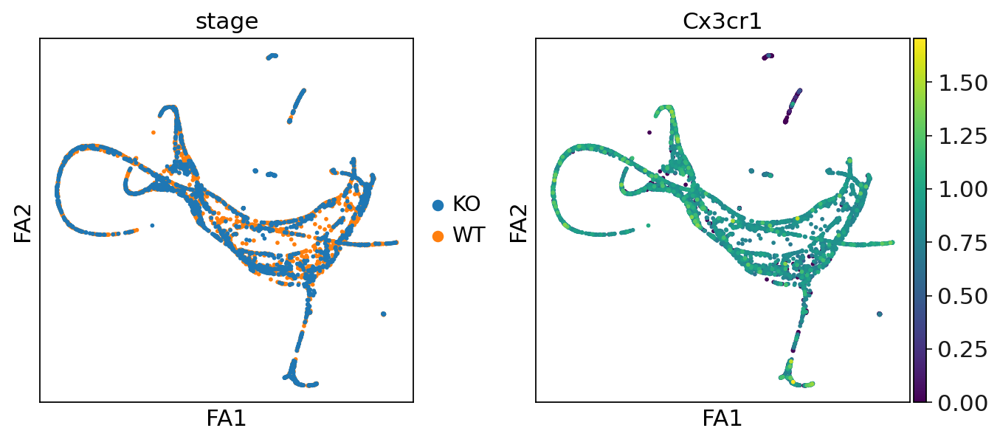

In [65]:
sc.set_figure_params()
sc.pl.draw_graph(adataall,color=["stage",'Cx3cr1']) #UMAP-based

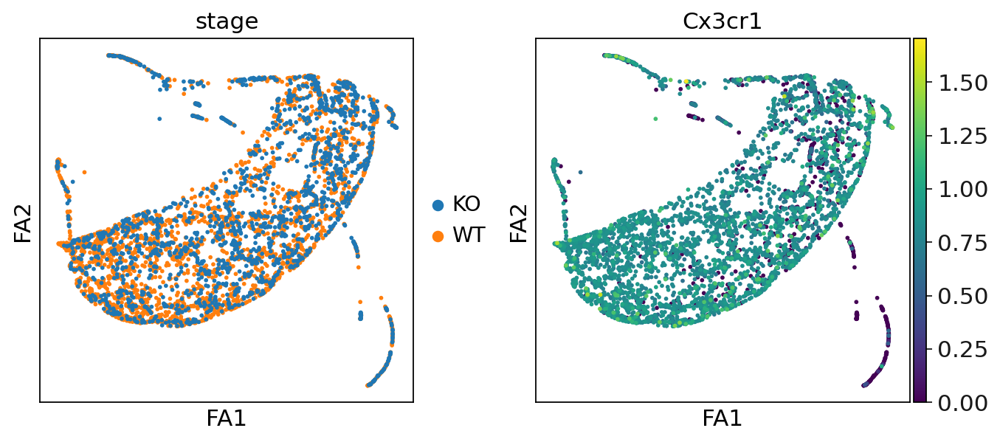

In [74]:
sc.set_figure_params()
sc.pl.draw_graph(adataall,color=["stage",'Cx3cr1']) #PCA-based, n_neighbors = 15, n_eigs = 4

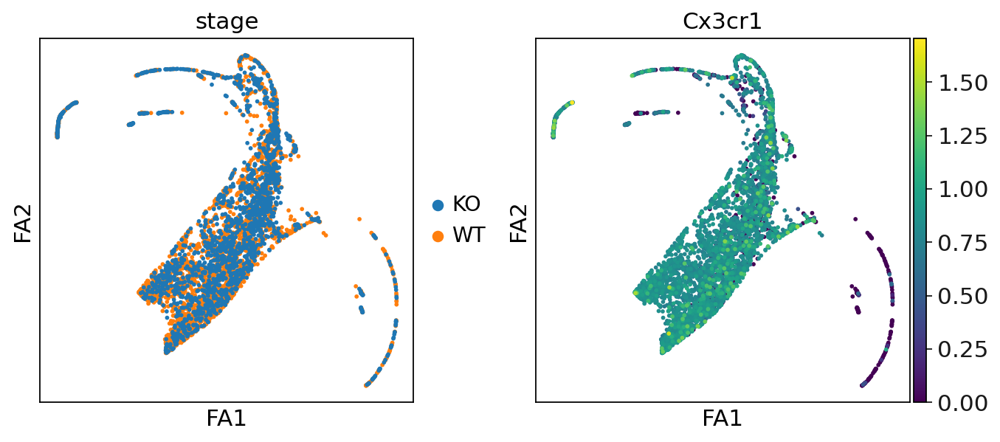

In [79]:
sc.set_figure_params()
sc.pl.draw_graph(adataall,color=["stage",'Cx3cr1']) #PCA-based, n_neighbors = 15, n_eigs = 8

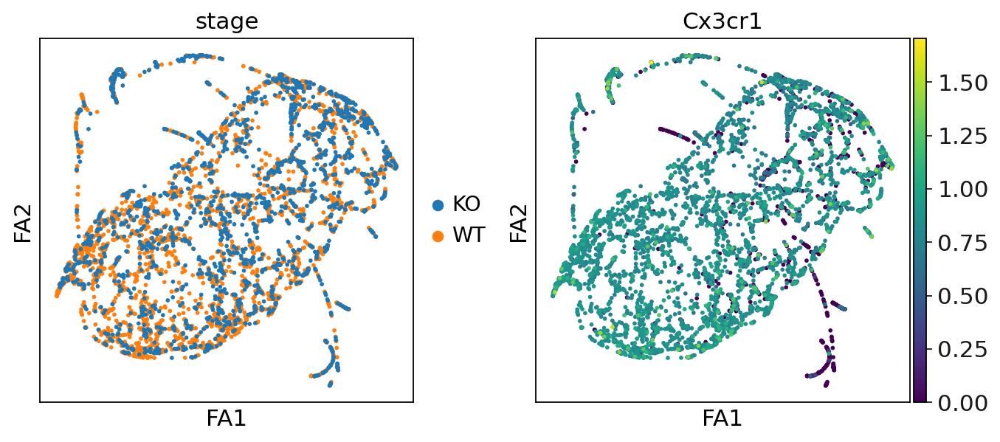

In [83]:
sc.set_figure_params()
sc.pl.draw_graph(adataall,color=["stage",'Cx3cr1']) #PCA-based, n_neighbors = 5, n_eigs = 4

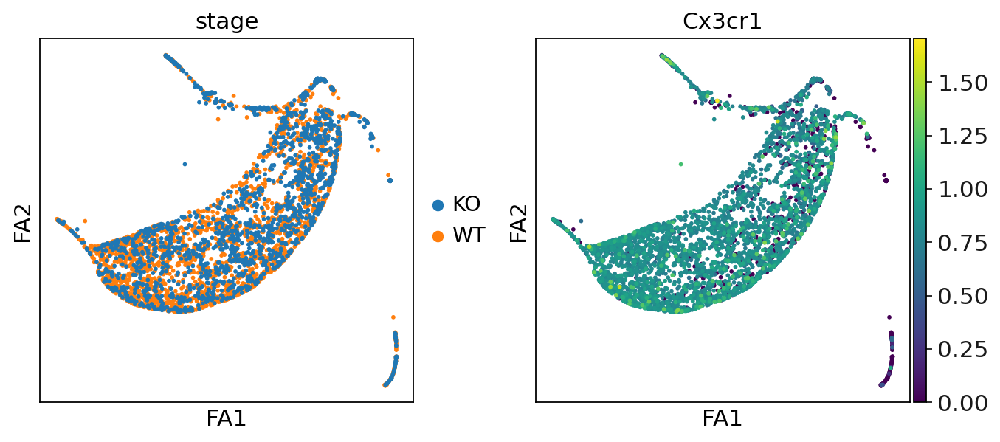

In [86]:
sc.set_figure_params()
sc.pl.draw_graph(adataall,color=["stage",'Cx3cr1']) #PCA-based, n_neighbors = 50, n_eigs = 4

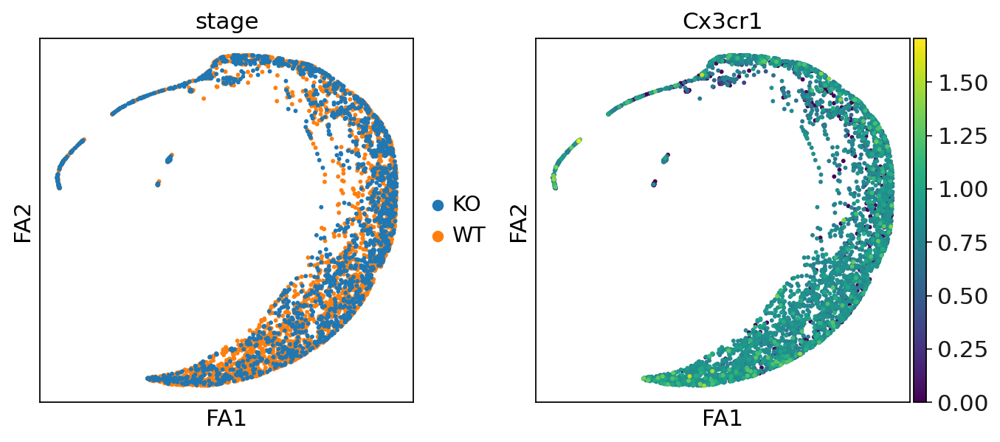

In [254]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=["stage",'Cx3cr1']) #PCA-based, n_neighbors = 50, n_eigs = 4

In [255]:
sc.tl.leiden(adatasubset)

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


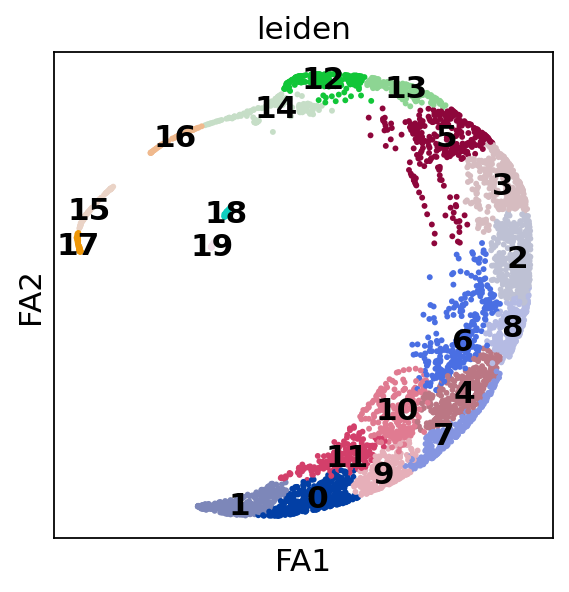

In [256]:
sc.pl.draw_graph(adatasubset,color=["leiden"], legend_loc = 'on data')

In [94]:
adata1.var

,n_cells,highly_variable,means,dispersions,dispersions_norm
Rp1,8,True,0.009278,2.310357,10.119288
Sox17,3,True,0.002247,1.425789,3.522815
Mrpl15,394,False,0.155626,0.672802,-0.712383
Lypla1,167,False,0.061322,0.732277,0.224829
Tcea1,605,False,0.265470,0.653691,0.199233
...,...,...,...,...,...
Csprs,58,False,0.020804,0.721572,-0.229237
AC168977.1,7,False,0.002279,0.607597,-0.696567
AC149090.1,1040,False,0.636850,0.643134,0.839423
CAAA01118383.1,249,False,0.099217,0.752064,1.059831


In [257]:
sc.tl.score_genes(adatasubset, gene_list = ['Cxcl10','Stat1','Ifit1'], score_name = 'IFN-response')

computing score 'IFN-response'
    finished: added
    'IFN-response', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)


In [258]:
sc.tl.score_genes(adatasubset, gene_list = ['Apoe','Igf1','H2-Aa','Cd74'], score_name = 'Inflammatory')

computing score 'Inflammatory'
    finished: added
    'Inflammatory', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)


In [259]:
sc.tl.score_genes(adatasubset, gene_list = ['P2ry12', 'Ccr5', 'Cd33', 'Csf1r', 'Cx3cr1', 'Glul', 'Gpr34', 'Adgrg1', 'Tgfb1', 'Tgfbr1', 'Serinc3', 'Siglech', 'Mertk', 'Bin1', 'Tmem119', 'Spi1', 'Sall1', 'Mafb', 'Smad3', 'Mef2a', 'Egr1', 'Jun'], score_name = 'Homeostatic')

computing score 'Homeostatic'
    finished: added
    'Homeostatic', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)


In [260]:
sc.tl.score_genes(adatasubset, gene_list = ['Apoe', 'Axl', 'Clec7a', 'Csf1', 'Cst7', 'Ctsb', 'Ctsd', 'Cybb', 'Fabp5', 'Fth1', 'Gnas', 'Gpnmb', 'Grn', 'Il1b', 'Lgals3', 'Lilrb4a', 'Lpl', 'Lyz2', 'Msr1', 'Spp1', 'Trem2', 'Tyrobp', 'Vegfa', 'H2-Ab1'], score_name = 'Proinflammatory')

computing score 'Proinflammatory'
    finished: added
    'Proinflammatory', score of gene set (adata.obs).
    647 total control genes are used. (0:00:00)


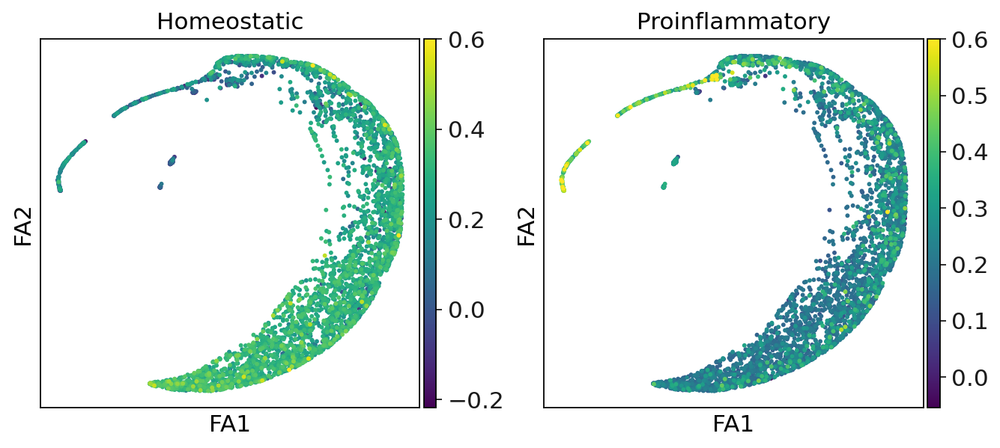

In [261]:
sc.pl.draw_graph(adatasubset,color=['Homeostatic','Proinflammatory'], vmax = [0.6,0.6])

In [262]:
sc.tl.score_genes(adatasubset, gene_list = ['Mki67','Cdc20'], score_name = 'Proliferating')

computing score 'Proliferating'
    finished: added
    'Proliferating', score of gene set (adata.obs).
    99 total control genes are used. (0:00:00)


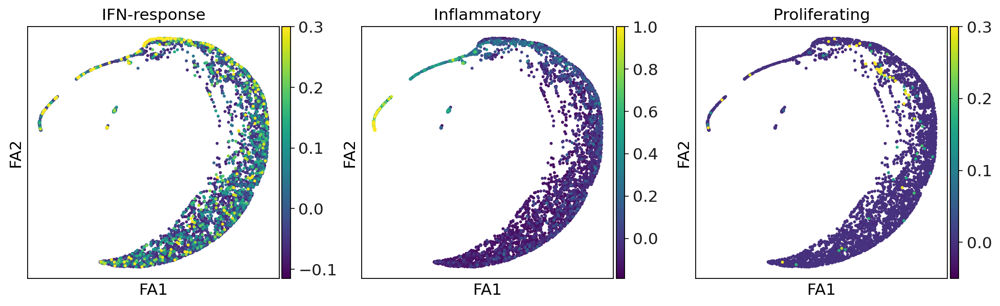

In [263]:
sc.pl.draw_graph(adatasubset,color=['IFN-response','Inflammatory','Proliferating'], vmax = [0.3,1,0.3])

In [278]:
scf.tl.tree(adatasubset,method="ppt",Nodes=200,use_rep="palantir",
            device="cpu",seed=1,ppt_lambda=1000,ppt_sigma=0.01,ppt_nsteps=100)

inferring a principal tree --> parameters used 
    200 principal points, sigma = 0.01, lambda = 1000, metric = euclidean
    fitting:  99%|█████████████████████████████████████████████████▌| 99/100 [00:33<00:00,  2.93it/s]
    converged
    not converged (error: 0.0049458300247539584)
    finished (0:00:33) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


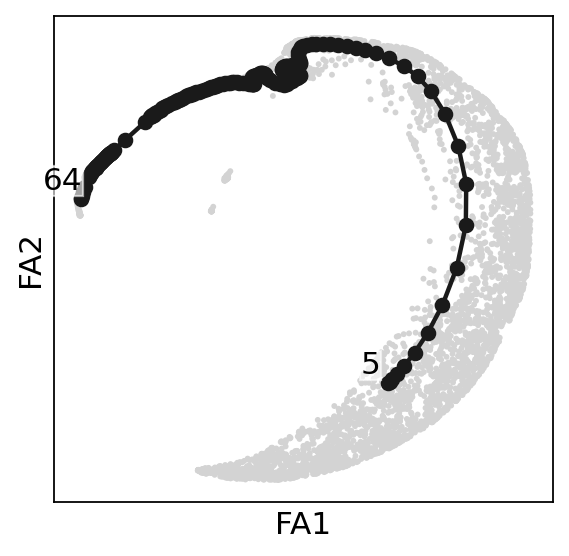

In [279]:
scf.pl.graph(adatasubset)

In [280]:
scf.tl.root(adatasubset,5)

node 5 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [281]:
scf.tl.pseudotime(adatasubset,n_jobs=20,n_map=100,seed=42)

projecting cells onto the principal graph
    mappings:  41%|████████████████████                             | 41/100 [00:53<01:17,  1.32s/it]


ValueError: probabilities do not sum to 1

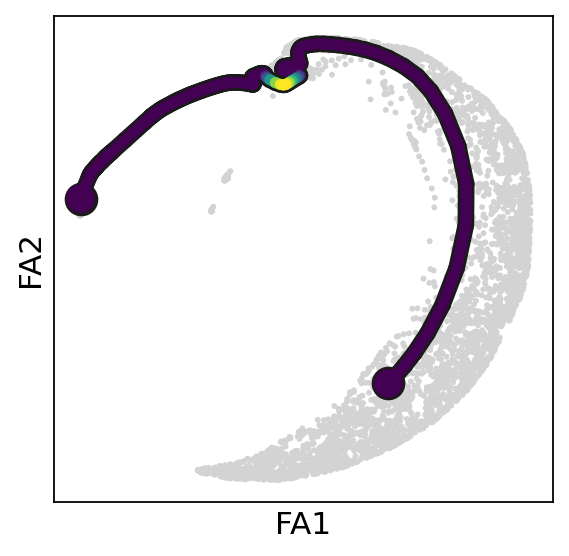

In [282]:
scf.pl.trajectory(adatasubset)

In [283]:
sc.tl.tsne(adatasubset)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:36)


In [288]:
old_to_new = {
'17':'Inflammatory',
'15':'Inflammatory',
'16':'Inflammatory',
'14':'Inflammatory',
'5':'Proliferating',
'14':'IFN-response',
'12':'IFN-response',
'13':'IFN-response',
'3':'Resident',
'2':'Resident',
'6':'Resident',
'8':'Resident',
'4':'Resident',
'7':'Resident',
'10':'Resident',
'11':'Resident',
'9':'Resident',
'0':'Resident',
'1':'Resident'}
adatasubset.obs['annotation'] = (
adatasubset.obs['leiden']
.map(old_to_new).astype('category')
)


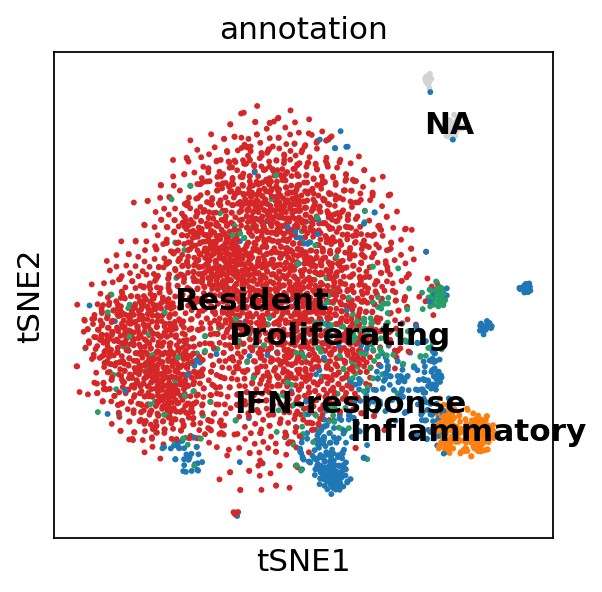

In [289]:
sc.pl.tsne(adatasubset,color=["annotation"], legend_loc = 'on data')

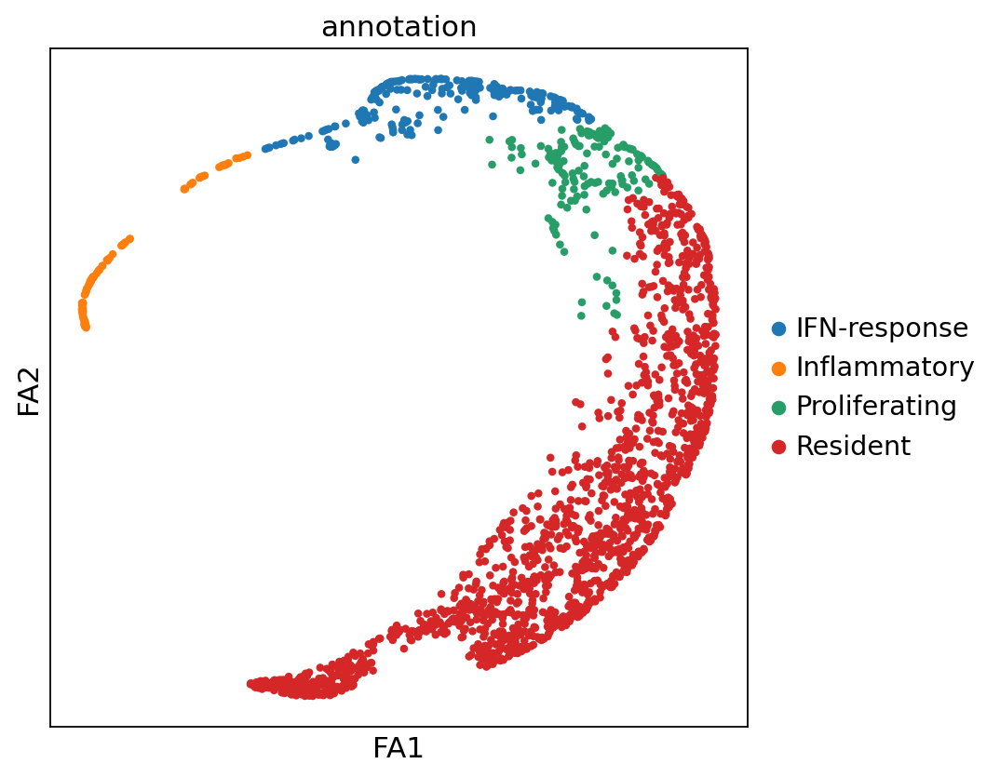

In [224]:
sc.pl.draw_graph(microgliaChen_WT,color=["annotation"], legend_loc = 'right margin')

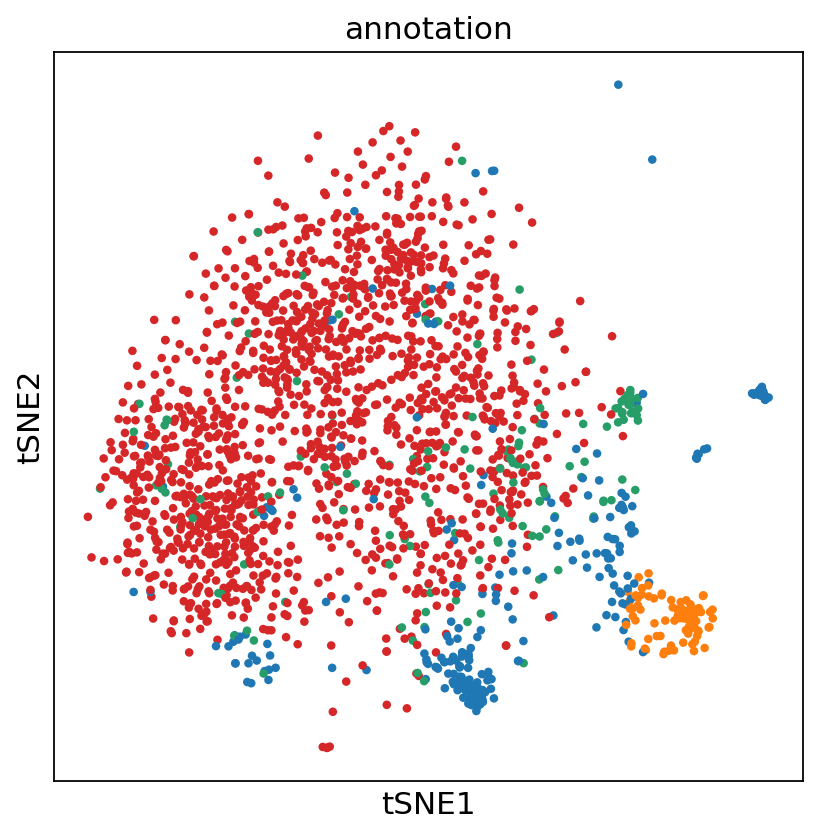

In [225]:
sc.set_figure_params(figsize = [6,6])
sc.pl.tsne(microgliaChen_WT,color=["annotation"], legend_loc = 'r')

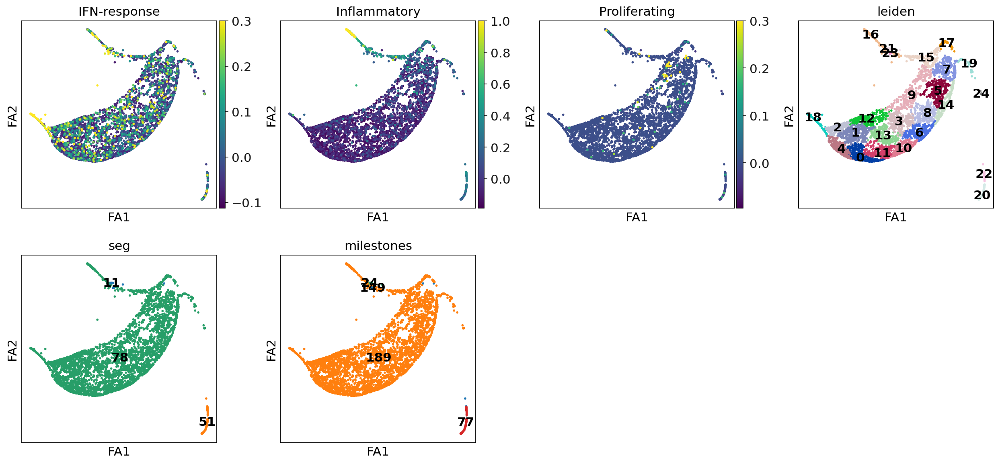

In [244]:
sc.pl.draw_graph(adataall,color=['IFN-response','Inflammatory','Proliferating','leiden','seg','milestones'], vmax = [0.3,1,0.3], legend_loc = 'on data')

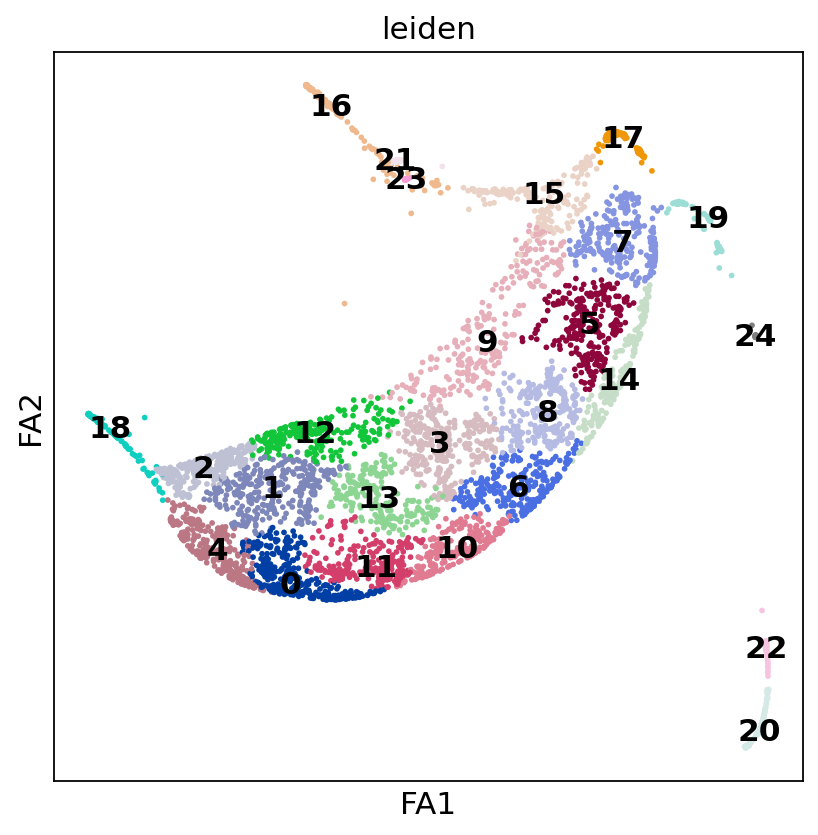

In [245]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataall,color=['leiden'], legend_loc = 'on data')

In [246]:
adatasubset = adataall[adataall.obs['leiden'].isin(['16','21','23','15','17','7','5','14','9',
                                                    '8','3','6','10','13','12','1','2','4','0','11','18'])]

In [291]:
adatainfl = adatasubset[adatasubset.obs['annotation'].isin(['Inflammatory'])]

In [294]:
adatainfl1 = adatainfl[adatainfl.obs['stage'].isin(['KO'])]

In [295]:
adatainfl2 = adatainfl[adatainfl.obs['stage'].isin(['WT'])]

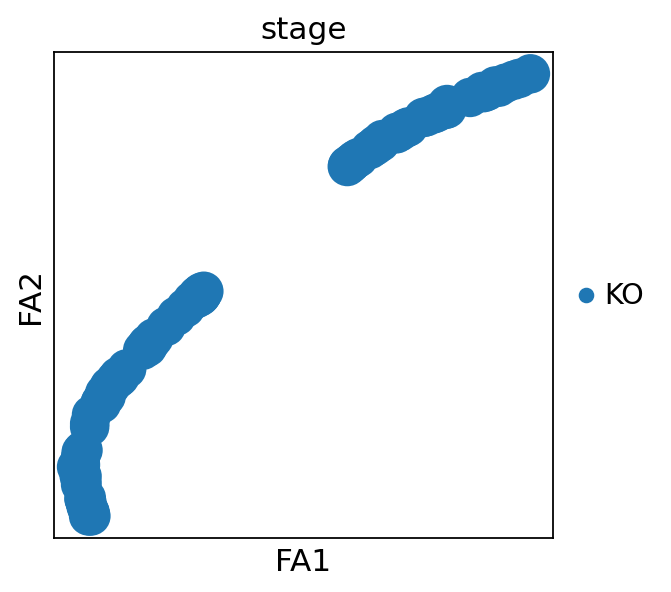

In [296]:
sc.pl.draw_graph(adatainfl1,color=['stage'])

In [302]:
adatainfl2

View of AnnData object with n_obs × n_vars = 95 × 16395
    obs: 'stage', 'batch', 'Homeostatic', 'Proinflammatory', 'IFN-response', 'Inflammatory', 'Proliferating', 't', 'seg', 'edge', 't_sd', 'milestones', 'leiden', 'annotation'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'umap', 'graph', 'ppt', 'pseudotime_list', 'milestones_colors', 'leiden', 'seg_colors', 'rank_genes_groups', 'tsne', 'annotation_colors'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap', 'X_umap2d', 'X_R', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

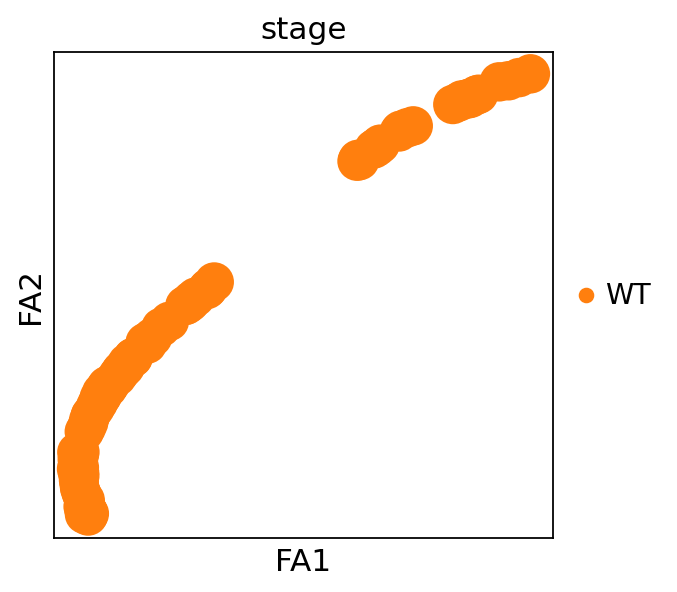

In [297]:
sc.pl.draw_graph(adatainfl2,color=['stage'])

In [308]:
adatainfl1.obs.groupby(["leiden"]).apply(len)

leiden
15    36
16    36
17    23
dtype: int64

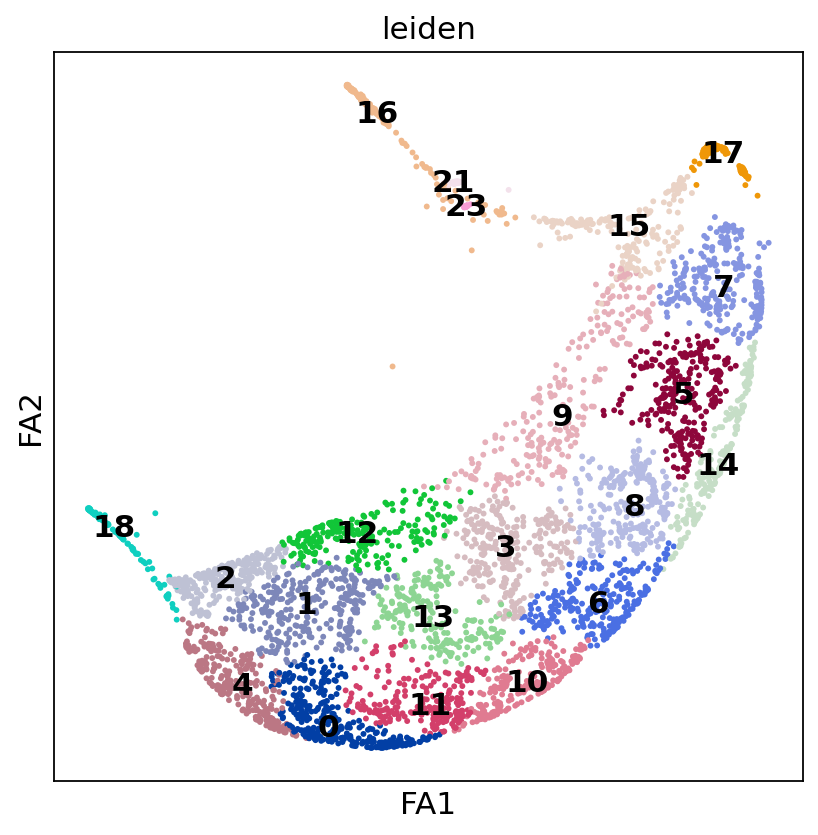

In [247]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adatasubset,color=['leiden'], legend_loc = 'on data')

In [304]:
AnnData.write_h5ad(adatasubset, "/mnt/c/Users/Emil/10X/microglia.h5ad")

In [336]:
adatasubset.var_names

Index(['Rp1', 'Sox17', 'Mrpl15', 'Lypla1', 'Gm37988', 'Tcea1', 'Rgs20',
       'Gm16041', 'Atp6v1h', 'Rb1cc1',
       ...
       'mt-Cytb', 'Vamp7', 'Tmlhe', 'AC133103.1', 'Csprs', 'AC132444.6',
       'AC168977.1', 'AC149090.1', 'CAAA01118383.1', 'CAAA01147332.1'],
      dtype='object', length=16395)

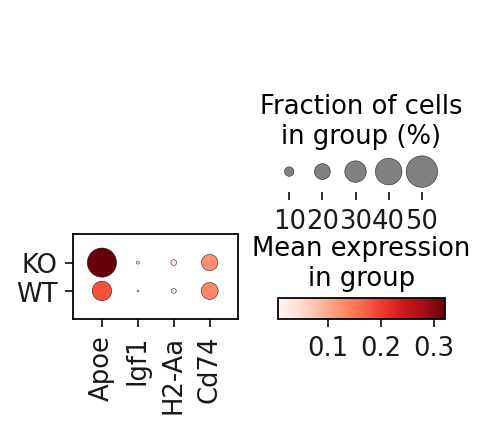

In [343]:
sc.pl.dotplot(adatasubset, var_names = ['Apoe','Igf1','H2-Aa','Cd74'], groupby = 'stage')

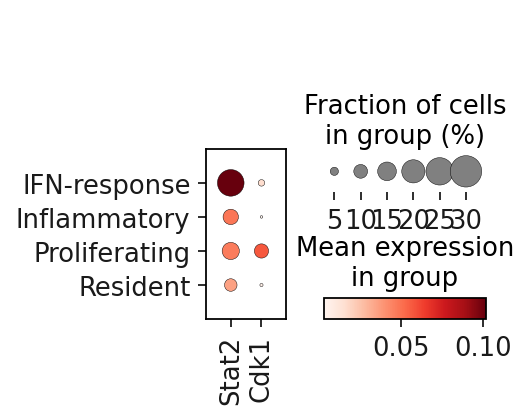

In [352]:
sc.pl.dotplot(adatasubset, var_names = ['Stat2','Cdk1'], groupby = 'annotation')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:28)


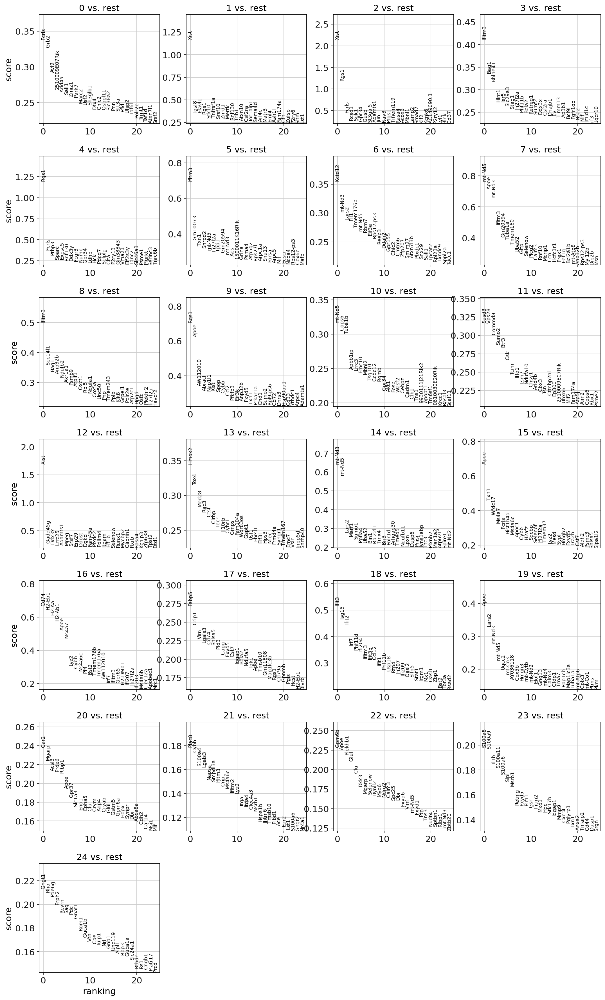

In [242]:
sc.tl.rank_genes_groups(adataall, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adataall, n_genes=25, sharey=False)

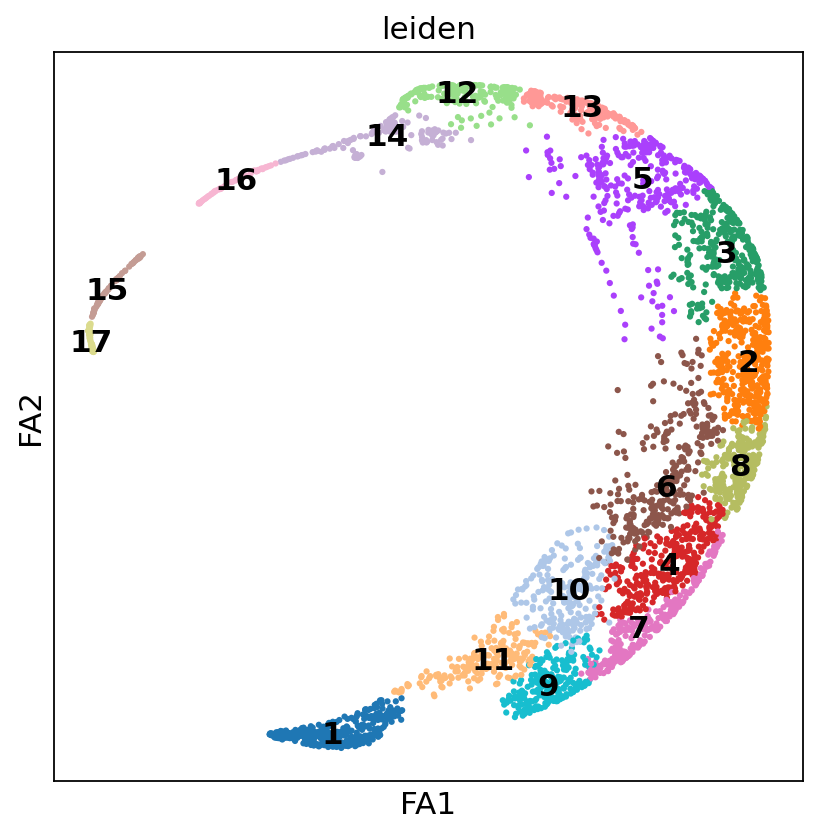

In [9]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adata,color=['leiden'], legend_loc = 'on data')

In [153]:
adataWT = adata[adata.obs['stage'].isin(['WT'])]

In [154]:
adataKO = adata[adata.obs['stage'].isin(['KO'])]

In [152]:
adata = adata[adata.obs['leiden'].isin(['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17'])]

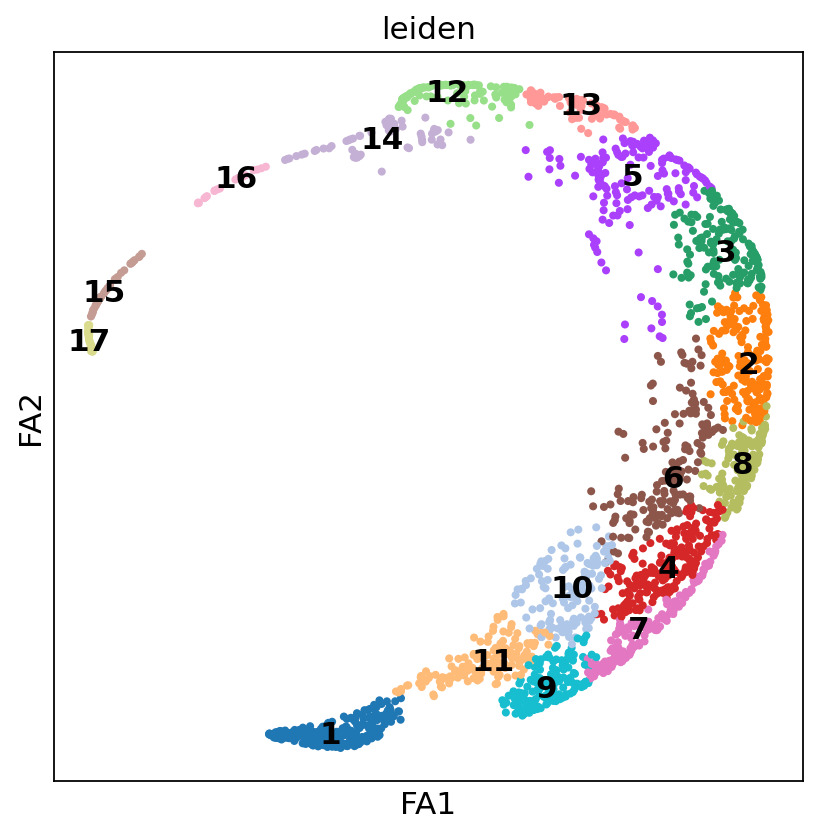

In [155]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataWT,color=['leiden'], legend_loc = 'on data')

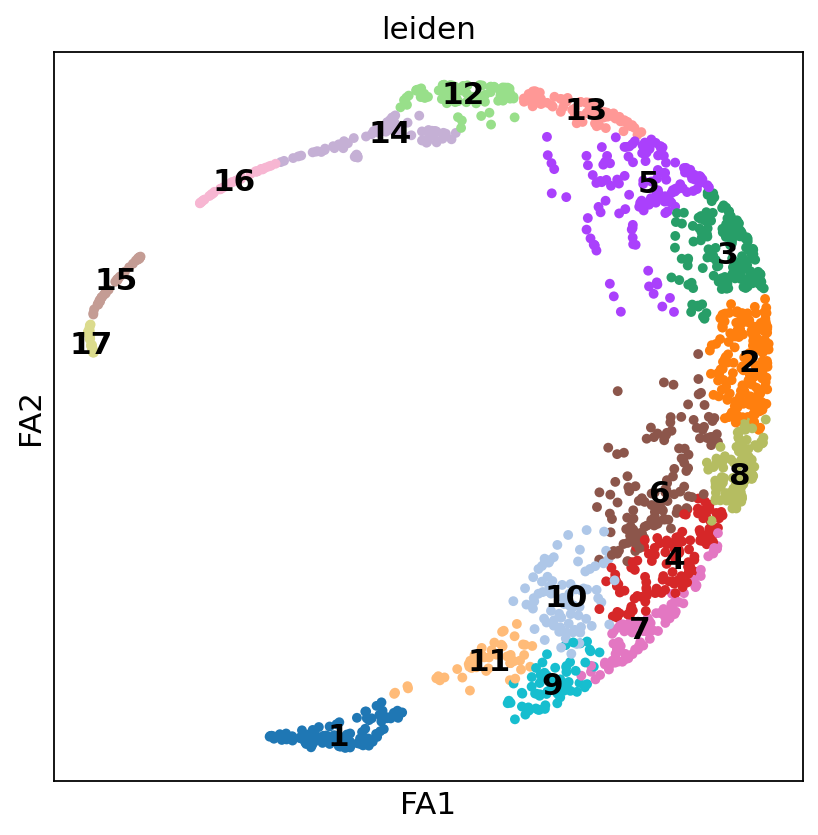

In [156]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataKO,color=['leiden'], legend_loc = 'on data')

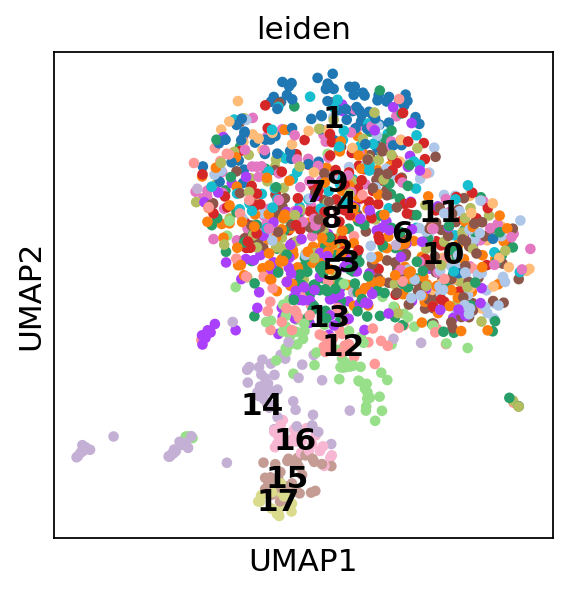

In [214]:
sc.pl.umap(adataKO,color=['leiden'], legend_loc = 'on data')

In [157]:
adataKO.obs

,stage,batch,Homeostatic,Proinflammatory,IFN-response,Inflammatory,Proliferating,t,seg,edge,t_sd,milestones,leiden,annotation
AAACCCACAGAGAATT-1,KO,1,3.03e-01,0.13,0.01,-0.16,-2.87e-03,4.71e-03,78,15|151,0.02,189,10,Resident
AAACCCACATGACAAA-1,KO,1,3.28e-01,0.12,0.02,-0.02,-1.36e-02,6.76e-03,78,103|146,0.05,189,3,Resident
AAACGAAAGGTAACTA-1,KO,1,2.88e-01,0.19,-0.07,-0.07,0.00e+00,8.89e-03,78,166|40,0.07,189,3,Resident
AAACGAAGTGATCGTT-1,KO,1,6.35e-02,0.53,-0.04,0.94,0.00e+00,1.76e-02,78,128|46,0.08,189,17,Inflammatory
AAACGAATCGAACGCC-1,KO,1,-7.83e-03,0.32,-0.05,0.16,0.00e+00,1.63e-02,78,130|80,0.10,189,12,IFN-response
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGTCTTGCAAG-1,KO,1,2.64e-01,0.31,-0.03,-0.12,-9.42e-03,1.81e-03,78,37|40,0.01,189,4,Resident
TTTGGTTCATAATCGC-1,KO,1,1.76e-01,0.36,-0.07,0.48,-9.98e-03,3.30e-03,78,165|40,0.02,189,15,Inflammatory
TTTGTTGAGATCCTAC-1,KO,1,2.93e-01,0.18,-0.08,0.03,0.00e+00,1.67e-03,78,54|12,0.01,189,2,Resident
TTTGTTGAGGATTACA-1,KO,1,2.32e-01,0.34,-0.03,-0.13,0.00e+00,8.05e-03,78,162|145,0.05,189,1,Resident


In [14]:
import scvelo as scv

In [16]:
WT = scv.read(r"/mnt/g/SRAs/1id/WT_processed/velocyto/WT_processed.loom", cache=True)

... writing an h5ad cache file to speedup reading next time


In [17]:
KO = scv.read(r"/mnt/g/SRAs/1id/KO_processed/KO/microgliaKO/velocyto/microgliaKO.loom", cache=True)

... reading from cache file cache/mnt-g-SRAs-1id-KO_processed-KO-microgliaKO-velocyto-microgliaKO.h5ad


In [18]:
microgliaChen_WT = scv.utils.merge(microgliaChen_WT, WT)

In [19]:
microgliaChen_KO = scv.utils.merge(microgliaChen_KO, KO)

In [15]:
adata

AnnData object with n_obs × n_vars = 2016 × 15768
    obs: 'stage', 'batch', 'Homeostatic', 'Proinflammatory', 'IFN-response', 'Inflammatory', 'Proliferating', 't', 'seg', 'edge', 't_sd', 'milestones', 'leiden', 'annotation', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'annotation_colors', 'draw_graph', 'graph', 'hvg', 'leiden', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudotime_list', 'rank_genes_groups', 'seg_colors', 'stage_colors', 'tsne', 'umap', 'leiden_colors'
    obsm: 'X_R', 'X_draw_graph_fa', 'X_palantir', 'X_pca', 'X_pca2d', 'X_tsne', 'X_umap', 'X_umap2d'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

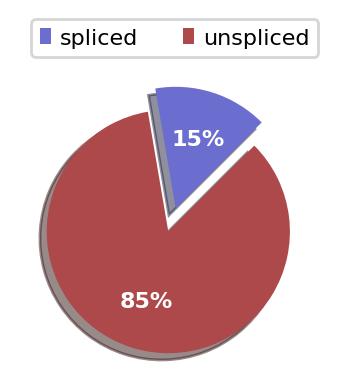

In [118]:
scv.pl.proportions(adatamergedvelo)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


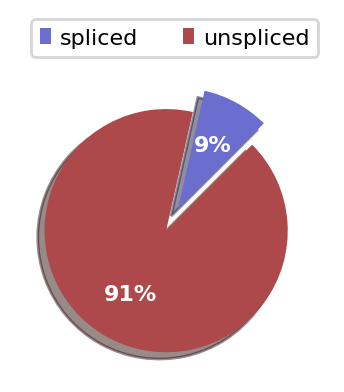

In [20]:
scv.pl.proportions(microgliaChen_KO)

In [21]:
scv.pp.filter_and_normalize(microgliaChen_KO, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(microgliaChen_KO, n_pcs=30, n_neighbors=30)

Filtered out 14954 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [22]:
scv.pp.filter_and_normalize(microgliaChen_WT, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(microgliaChen_WT, n_pcs=30, n_neighbors=30)

Filtered out 14805 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [23]:
scv.tl.velocity(microgliaChen_KO)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [24]:
scv.pp.neighbors(microgliaChen_WT)

computing neighbors
    finished (0:00:08) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [25]:
scv.tl.velocity(microgliaChen_KO)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [27]:
scv.tl.velocity_graph(microgliaChen_KO)

or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing velocity graph (using 1/12 cores)


  0%|          | 0/1320 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [26]:
scv.tl.velocity(microgliaChen_WT)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [28]:
scv.tl.velocity_graph(microgliaChen_WT)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2016 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


figure cannot be saved as pdf, using png instead.
saving figure to file figures/test_plot2.ps.png


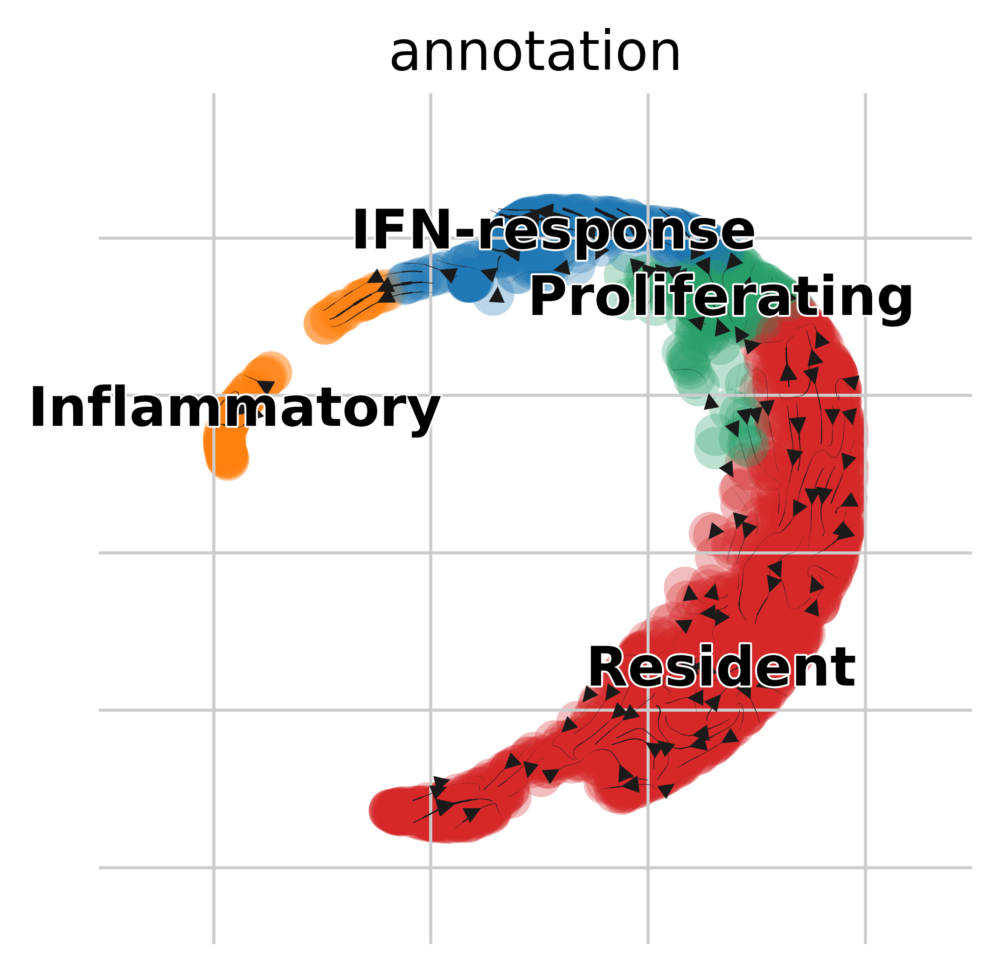

In [87]:
sc.set_figure_params(scanpy = True,format = 'ps')
scv.pl.velocity_embedding_stream(microgliaChen_WT, basis='draw_graph_fa', color = 'annotation', dpi = 300, density = 2, add_margin=0.2,save="figures/test_plot2.ps")




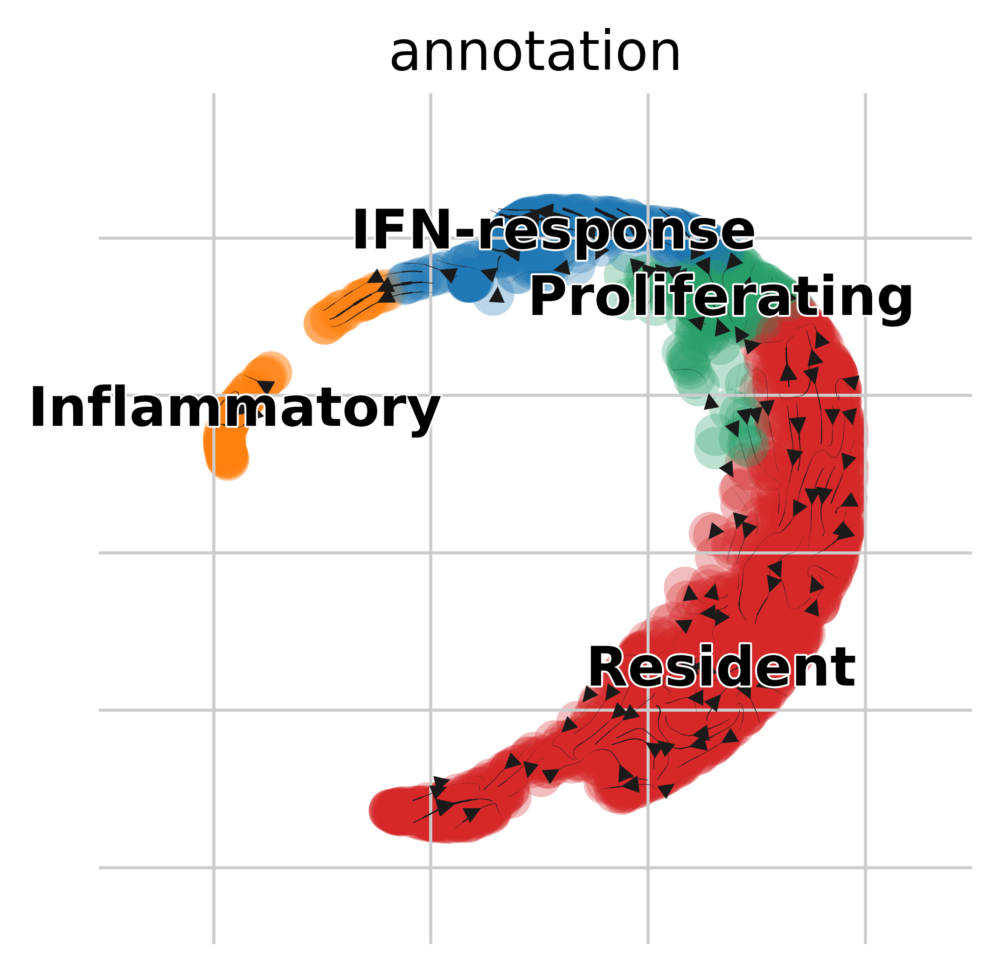

In [212]:
sc.set_figure_params(scanpy = True,format = 'ps')
scv.pl.velocity_embedding_stream(microgliaChen_WT, basis='draw_graph_fa', color = 'annotation', dpi = 300, density = 2, add_margin=0.2)



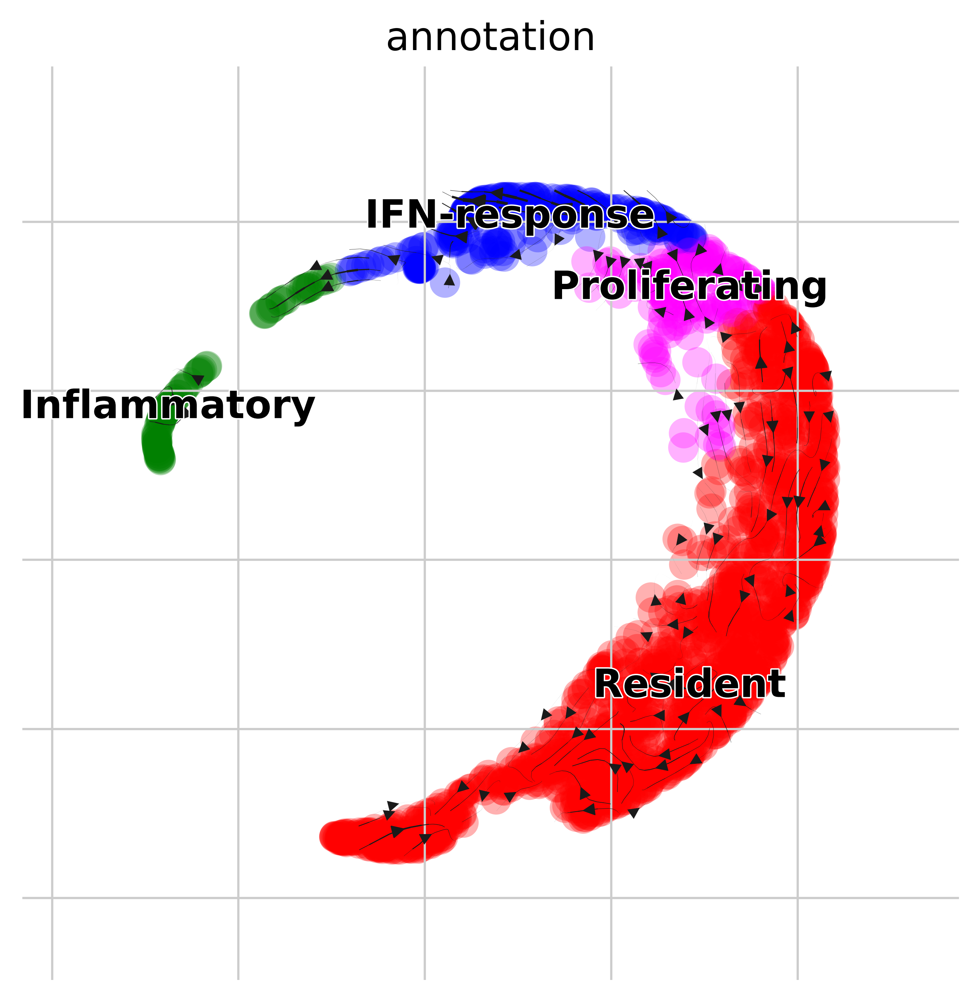

In [236]:
scv.pl.velocity_embedding_stream(microgliaChen_WT, basis='draw_graph_fa', color = 'annotation', palette = ['blue','green','magenta','red'], dpi = 300, density = 2, add_margin=0.2)

saving figure to file figures/test_plotKO.svg


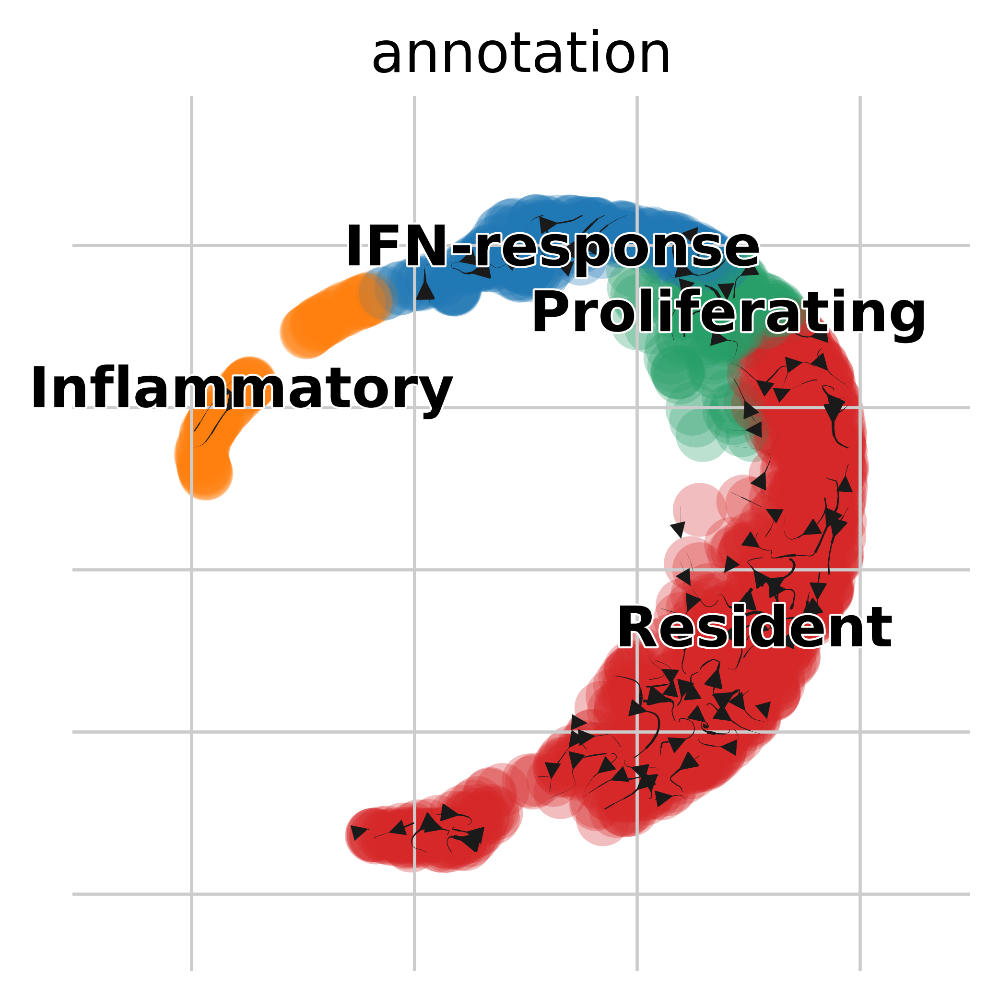

In [88]:
sc.set_figure_params(scanpy = True,format = 'svg')
scv.pl.velocity_embedding_stream(microgliaChen_KO, basis='draw_graph_fa', color = 'annotation', dpi = 300, density = 2, add_margin=0.2,save="figures/test_plotKO.svg")

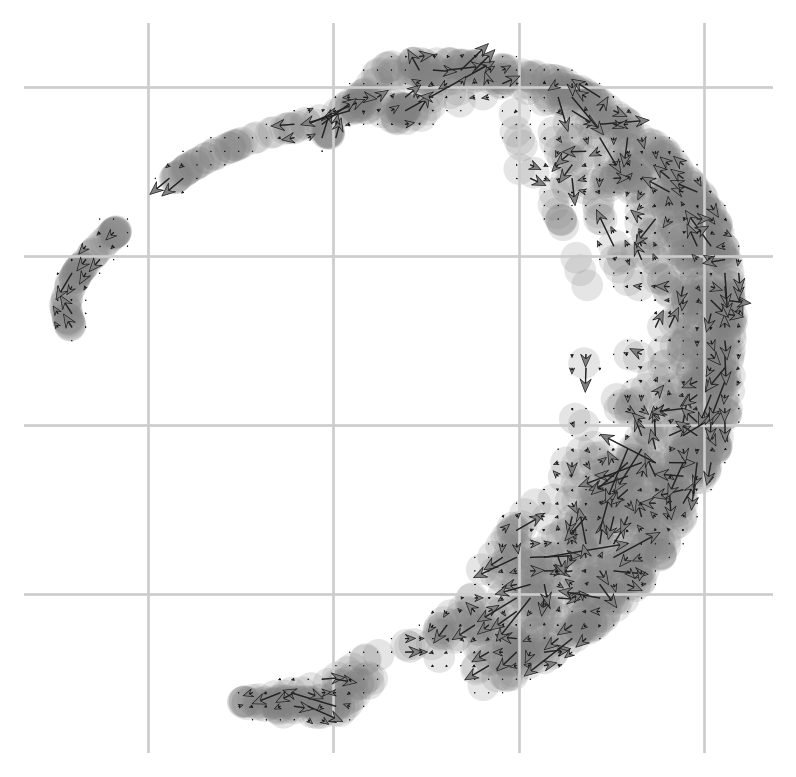

In [54]:
sc.set_figure_params(scanpy = True,format = 'svg')
scv.pl.velocity_embedding_grid(microgliaChen_KO, basis='draw_graph_fa', arrow_length = 3, arrow_size = 3, dpi=120,save="figures/embeddinggridKO.svg" )

saving figure to file figures/embeddinggridKO.svg


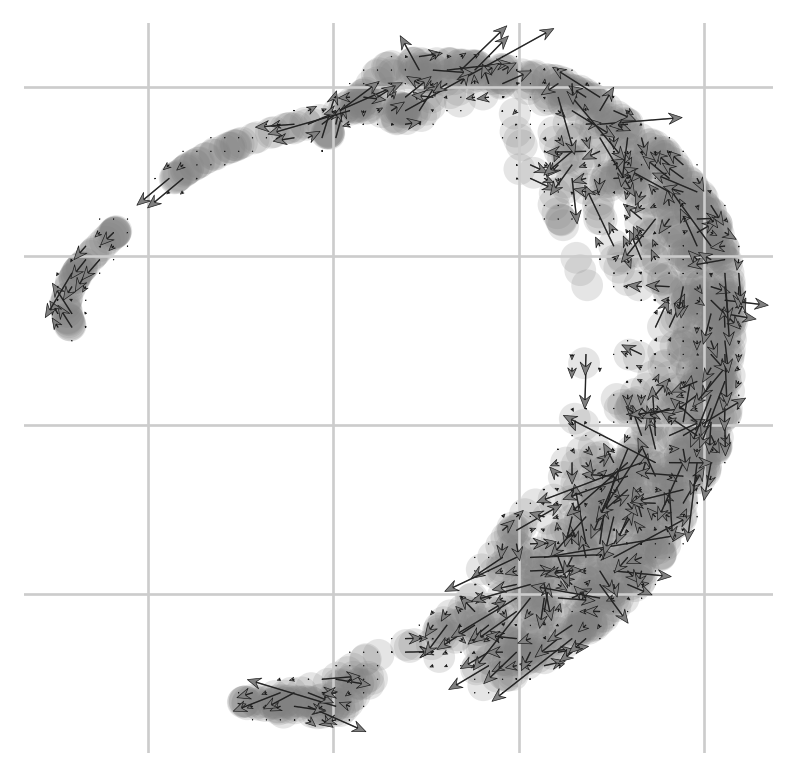

In [89]:
scv.pl.velocity_embedding_grid(microgliaChen_KO, basis='draw_graph_fa', arrow_length = 5, arrow_size = 3, dpi=120,save="figures/embeddinggridKO.svg"  )

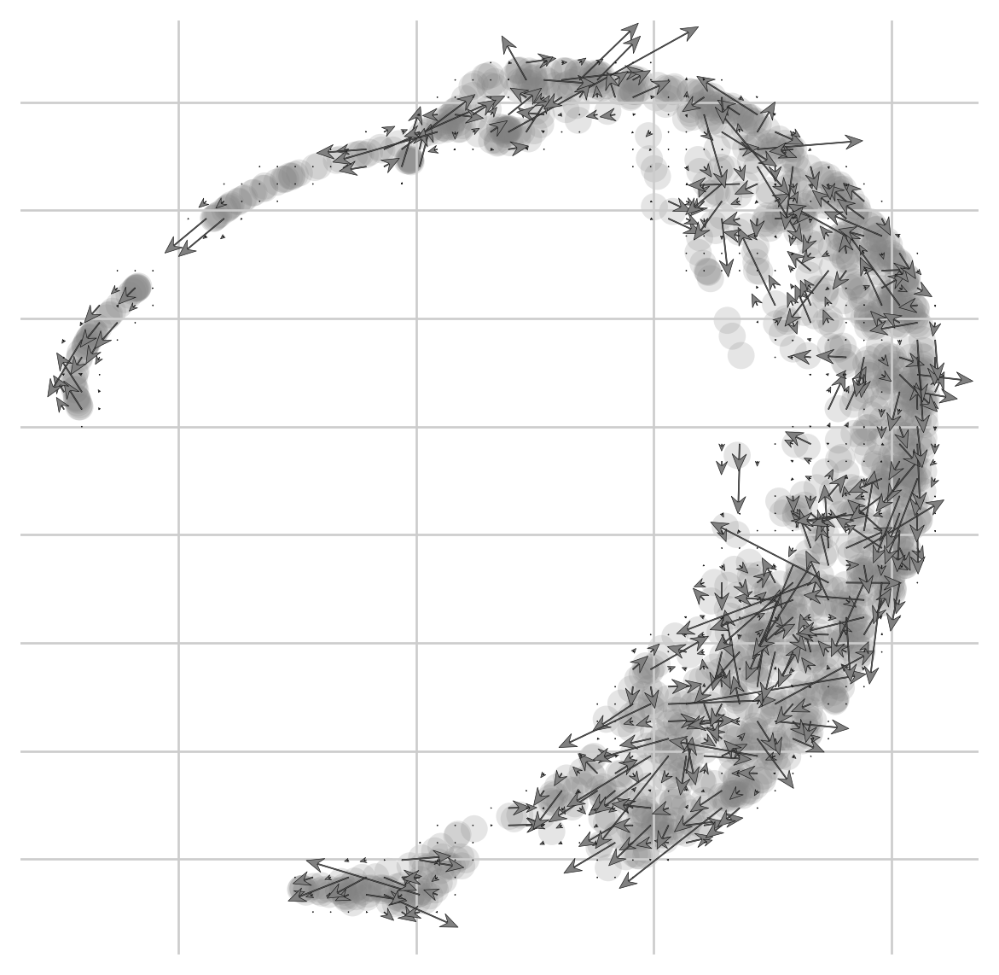

In [229]:
scv.pl.velocity_embedding_grid(microgliaChen_KO, basis='draw_graph_fa', arrow_length = 5, arrow_size = 3, dpi=120)

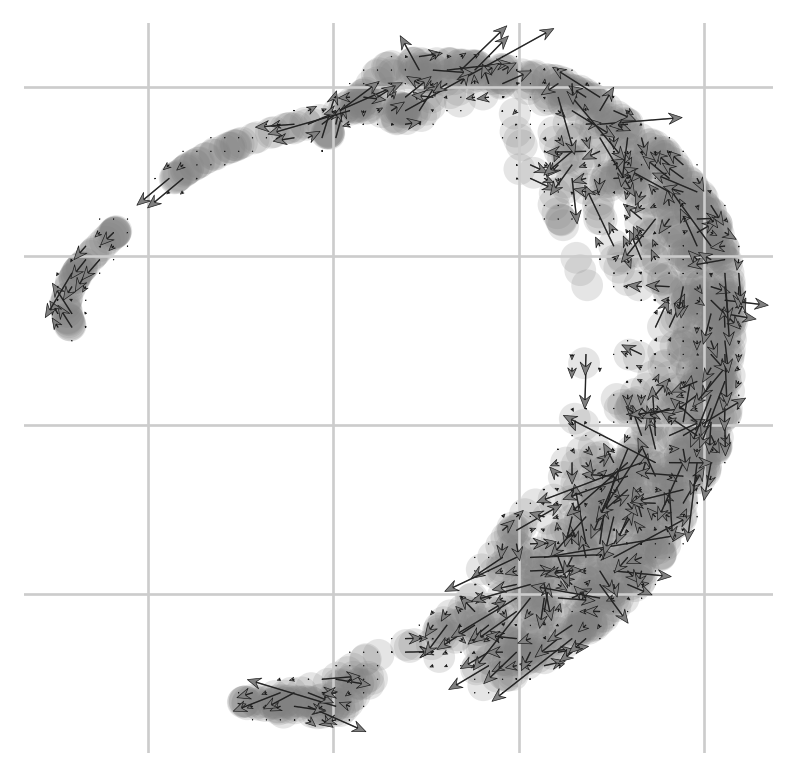

In [95]:
scv.pl.velocity_embedding_grid(microgliaChen_KO, basis='draw_graph_fa', arrow_length = 5, arrow_size = 3, dpi = 120, frameon = False)

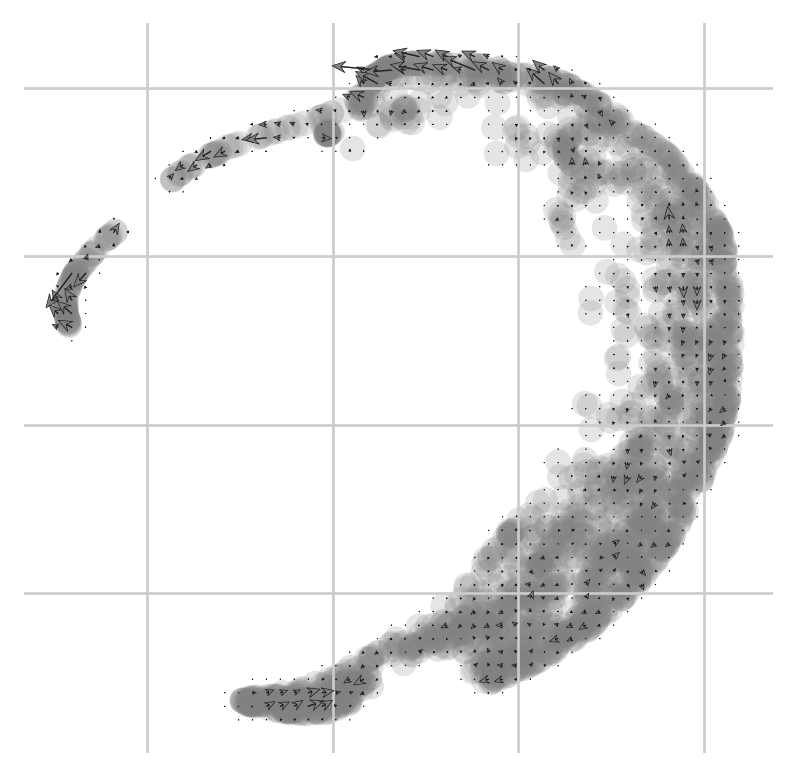

In [57]:
scv.pl.velocity_embedding_grid(microgliaChen_WT, basis='draw_graph_fa', arrow_length = 1, arrow_size = 3, dpi=120)

saving figure to file figures/embeddinggridWT2.svg


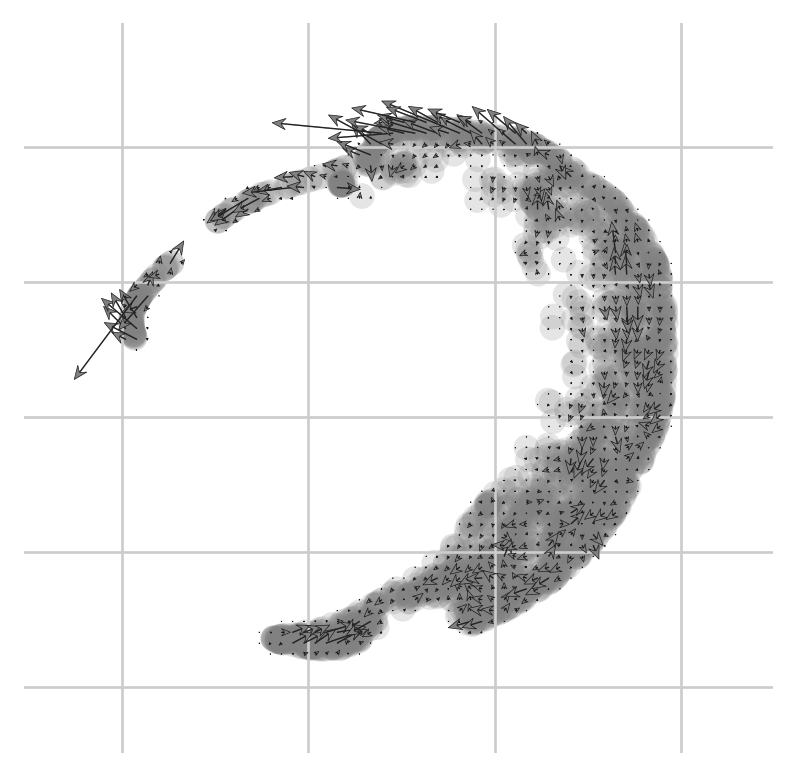

In [101]:
scv.pl.velocity_embedding_grid(microgliaChen_WT, basis='draw_graph_fa', arrow_length = 3, add_margin = 0.2, arrow_size = 3, dpi=120,save="figures/embeddinggridWT2.svg"  )

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


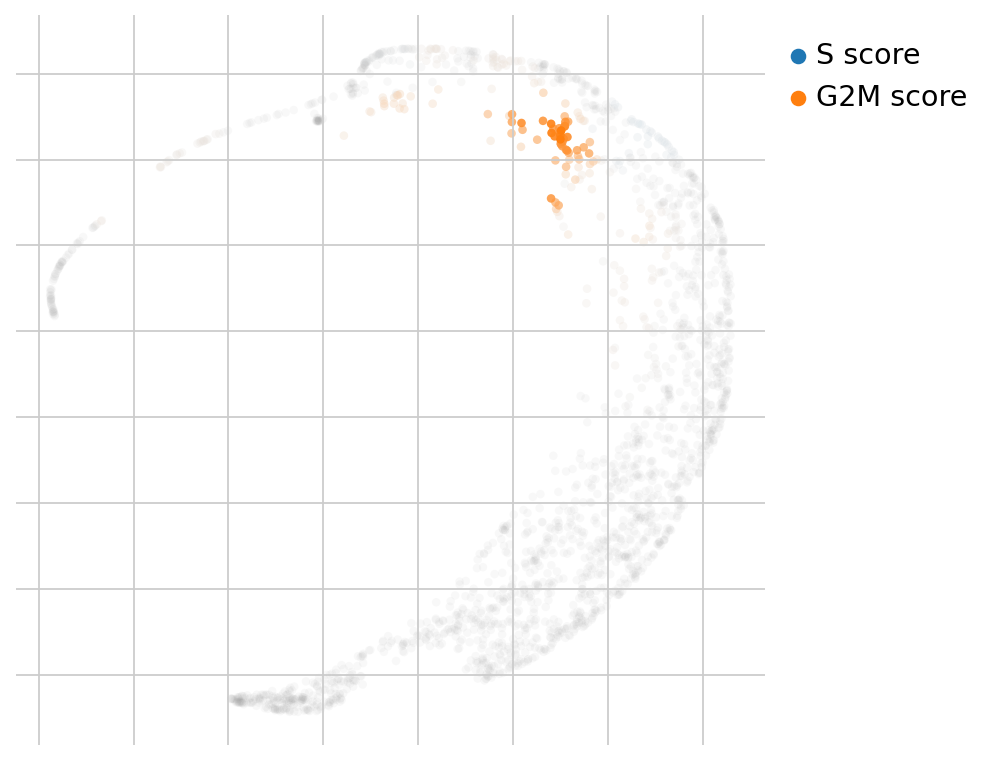

In [174]:
scv.tl.score_genes_cell_cycle(adataWT)
scv.pl.scatter(adataWT, color_gradients=['S_score', 'G2M_score'],basis='draw_graph_fa', smooth=True)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


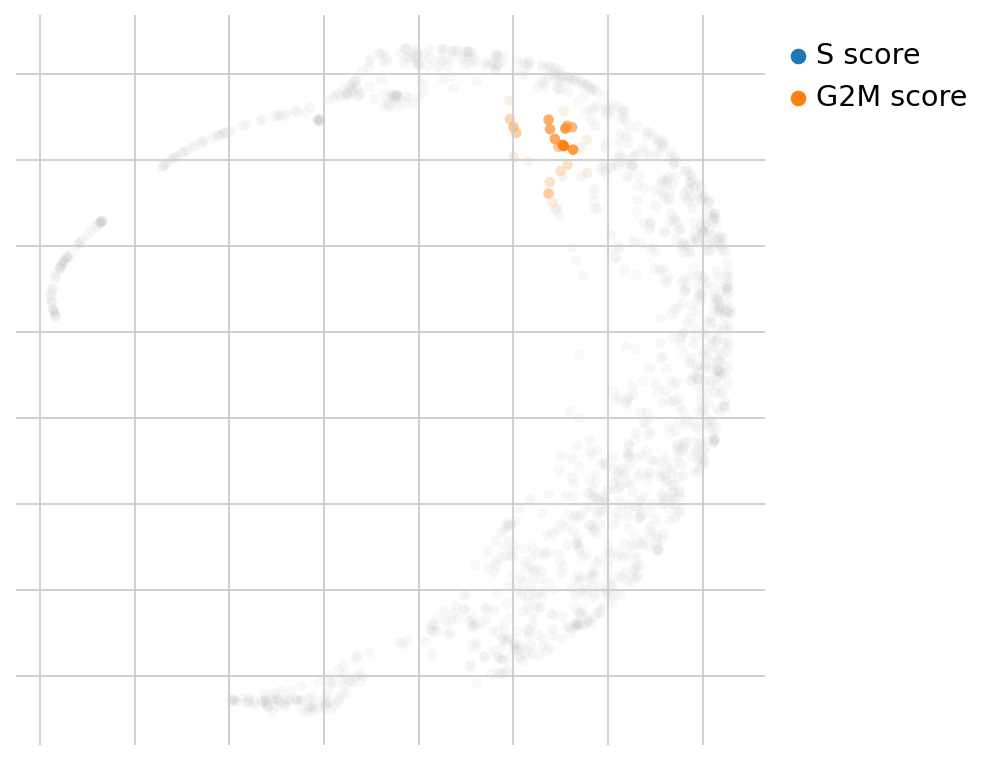

In [175]:
scv.tl.score_genes_cell_cycle(adataKO)
scv.pl.scatter(adataKO, color_gradients=['S_score', 'G2M_score'],basis='draw_graph_fa', smooth=True)

computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


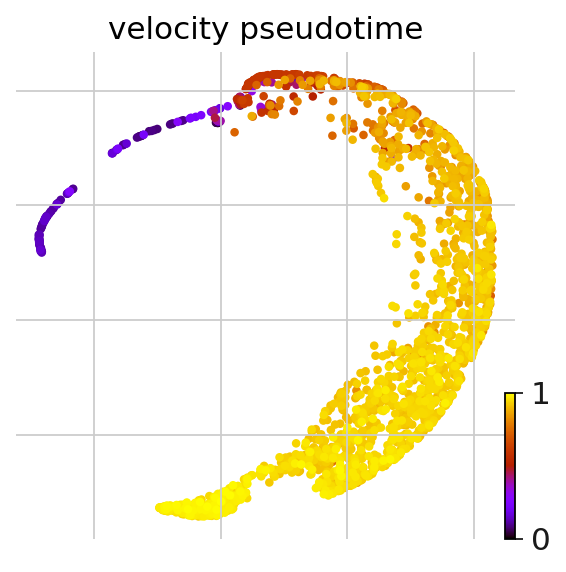

In [60]:
scv.tl.velocity_pseudotime(microgliaChen_WT)
scv.pl.scatter(microgliaChen_WT, color='velocity_pseudotime',basis='draw_graph_fa', cmap='gnuplot')

or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing terminal states
    identified 8 regions of root cells and 8 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


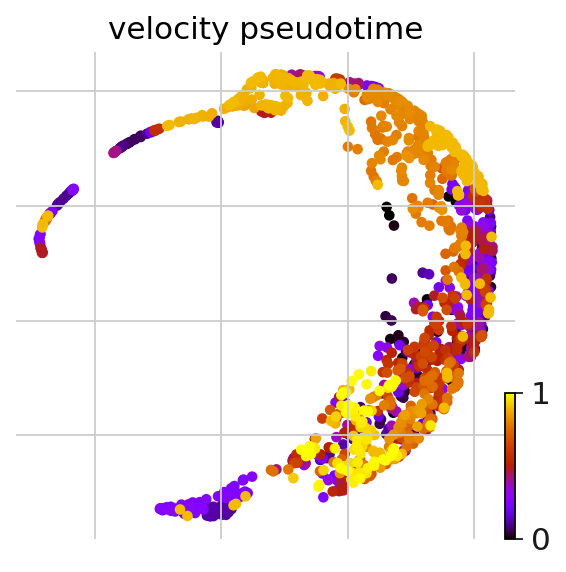

In [61]:
scv.tl.velocity_pseudotime(microgliaChen_KO)
scv.pl.scatter(microgliaChen_KO, color='velocity_pseudotime',basis='draw_graph_fa', cmap='gnuplot')

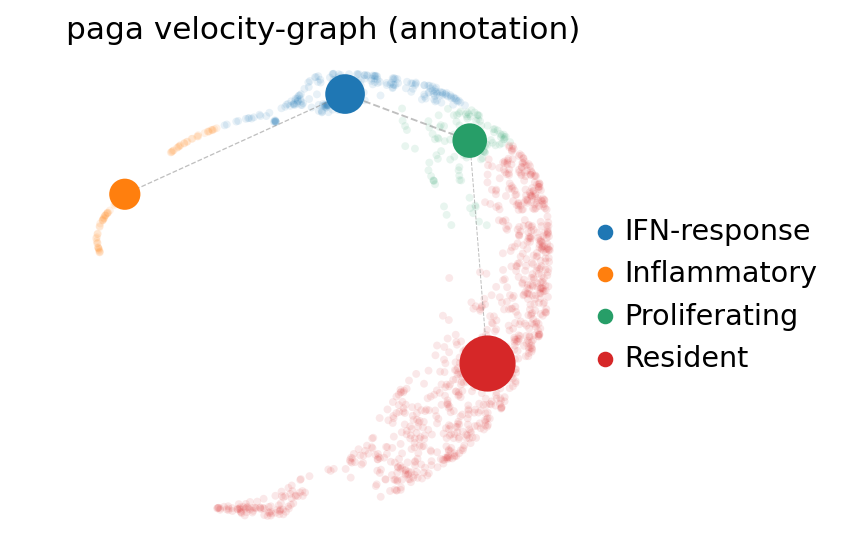

In [69]:
scv.pl.paga(microgliaChen_KO, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [ ]:
scv.pl.paga(adataKO, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, color = 'leiden')

In [180]:
!pip3 install python-igraph --upgrade --quiet

In [353]:
adataWT.obs

,stage,batch,Homeostatic,Proinflammatory,IFN-response,Inflammatory,Proliferating,t,seg,edge,...,initial_size,n_counts,velocity_self_transition,S_score,G2M_score,phase,clusters_gradients,root_cells,end_points,velocity_pseudotime
AAACCCAAGAGGACTC,WT,0,0.30,0.16,-0.10,-0.14,1.84e-01,7.39e-03,78,80|87,...,222.0,98.07,0.02,0.0,0.0,S,S_score,6.51e-04,8.18e-01,1.00
AAACGCTTCCTCTGCA,WT,0,0.33,0.24,-0.05,-0.16,-1.07e-02,2.22e-02,78,90|40,...,244.0,88.16,0.07,0.0,0.0,S,S_score,1.24e-02,2.09e-02,0.75
AAAGGATGTGAGTCAG,WT,0,0.23,0.29,-0.04,0.06,0.00e+00,2.44e-03,78,114|42,...,120.0,69.01,0.09,0.0,0.0,S,S_score,4.58e-03,5.26e-05,0.62
AAAGGTAAGGCACCAA,WT,0,0.32,0.18,-0.07,-0.17,-1.22e-02,9.77e-03,78,131|97,...,249.0,89.93,0.29,0.0,0.0,S,S_score,6.95e-02,0.00e+00,0.67
AAAGTCCAGCATCCCG,WT,0,0.27,0.23,-0.08,-0.06,0.00e+00,1.55e-02,78,134|42,...,245.0,81.30,0.40,0.0,0.0,S,S_score,6.48e-02,1.30e-03,0.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCATCTGGGC,WT,0,0.10,0.34,-0.08,0.28,-3.05e-03,1.70e-02,78,182|42,...,291.0,83.00,0.29,0.0,0.0,S,S_score,2.95e-01,9.47e-05,0.22
TTTGGTTCACTGGAAG,WT,0,0.27,0.38,-0.06,0.19,0.00e+00,3.08e-03,78,172|73,...,66.0,54.13,0.09,0.0,0.0,S,S_score,1.67e-02,1.67e-06,0.59
TTTGGTTTCGGATACT,WT,0,0.24,0.24,-0.05,-0.13,0.00e+00,9.81e-03,78,87|80,...,48.0,55.58,0.11,0.0,0.0,S,S_score,2.78e-02,4.28e-03,0.77
TTTGGTTTCTCCAAGA,WT,0,0.26,0.18,0.19,-0.16,0.00e+00,3.76e-03,78,195|134,...,210.0,83.92,0.07,0.0,0.0,S,S_score,4.10e-03,1.08e-01,0.81


In [355]:
scv.tl.recover_dynamics(adataWT)

recovering dynamics (using 1/12 cores)
    finished (0:00:03) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [356]:
scv.tl.latent_time(adataWT)

computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


In [7]:
microgliaChen = sc.read_h5ad("/mnt/c/Users/Emil/10X/microglia.h5ad")

In [8]:
microgliaChen

AnnData object with n_obs × n_vars = 4281 × 16395
    obs: 'stage', 'batch', 'Homeostatic', 'Proinflammatory', 'IFN-response', 'Inflammatory', 'Proliferating', 't', 'seg', 'edge', 't_sd', 'milestones', 'leiden', 'annotation'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'annotation_colors', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudotime_list', 'rank_genes_groups', 'seg_colors', 'stage_colors', 'tsne', 'umap'
    obsm: 'X_R', 'X_draw_graph_fa', 'X_palantir', 'X_pca', 'X_pca2d', 'X_tsne', 'X_umap', 'X_umap2d'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


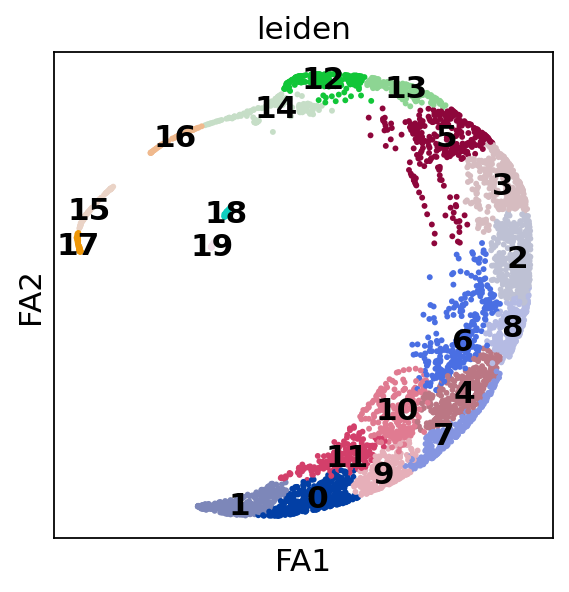

In [9]:
sc.pl.draw_graph(microgliaChen,color=['leiden'], legend_loc = 'on data')

In [10]:
microgliaChen = microgliaChen[microgliaChen.obs['leiden'].isin(['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17'])]

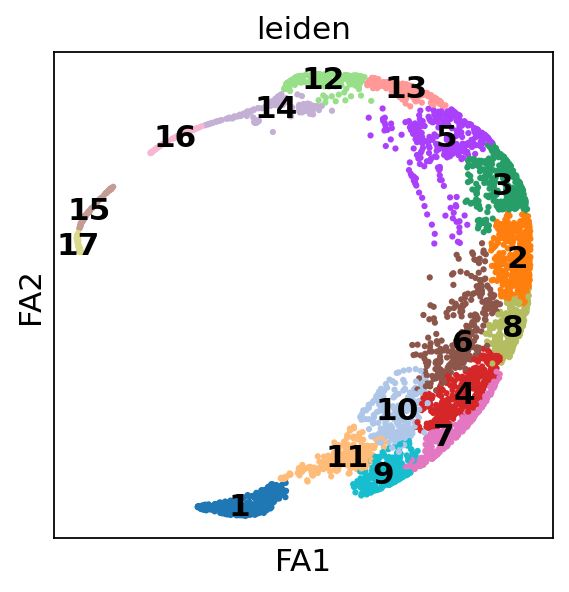

In [11]:
sc.pl.draw_graph(microgliaChen,color=['leiden'], legend_loc = 'on data')

In [12]:
microgliaChen_WT = microgliaChen[microgliaChen.obs['stage'].isin(['WT'])]

In [13]:
microgliaChen_KO = microgliaChen[microgliaChen.obs['stage'].isin(['KO'])]

In [228]:
pip list


Package                 Version
----------------------- -----------
adjustText              0.7.3
aiohttp                 3.8.3
aiosignal               1.3.1
anndata                 0.8.0
anndata2pagoda          0.1
anndata2ri              1.0.6
appdirs                 1.4.4
arboreto                0.1.6
argon2-cffi             21.3.0
argon2-cffi-bindings    21.2.0
args                    0.1.0
async-timeout           4.0.2
asynctest               0.13.0
attrs                   21.4.0
backcall                0.2.0
backports.zoneinfo      0.2.1
beautifulsoup4          4.11.1
bleach                  5.0.0
bokeh                   2.4.3
boltons                 21.0.0
brotlipy                0.7.0
cached-property         1.5.2
cellrank                1.2.0
certifi                 2021.10.8
cffi                    1.15.0
charset-normalizer      2.0.4
click                   8.1.2
clint                   0.5.1
cloudpickle             2.2.1
cmake                   3.24.1
colorama              

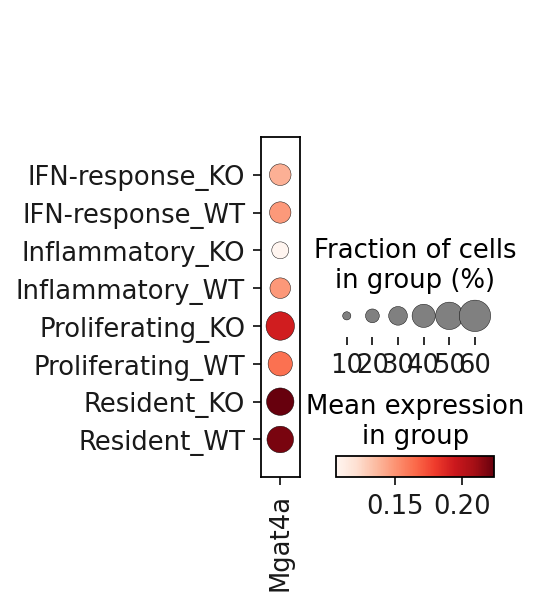

In [244]:
sc.pl.dotplot(microgliamerged, var_names = ['Mgat4a'], groupby = ['annotation','stage'])

In [238]:
microgliamerged = microgliaChen_WT.concatenate(microgliaChen_KO)

In [239]:
microgliamerged.obs

,stage,batch,Homeostatic,Proinflammatory,IFN-response,Inflammatory,Proliferating,t,seg,edge,...,leiden,annotation,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,root_cells,end_points,velocity_pseudotime
AAACCCAAGAGGACTC-0,WT,0,0.30,0.16,-0.10,-0.14,1.84e-01,7.39e-03,78,80|87,...,1,Resident,222,2440,222.0,98.07,3.80e-04,3.94e-01,7.59e-01,0.97
AAACGCTTCCTCTGCA-0,WT,0,0.33,0.24,-0.05,-0.16,-1.07e-02,2.22e-02,78,90|40,...,6,Resident,244,2365,244.0,88.16,2.40e-02,2.62e-01,7.02e-01,0.93
AAAGGATGTGAGTCAG-0,WT,0,0.23,0.29,-0.04,0.06,0.00e+00,2.44e-03,78,114|42,...,13,IFN-response,120,1185,120.0,69.01,2.09e-02,4.65e-01,4.91e-01,0.83
AAAGGTAAGGCACCAA-0,WT,0,0.32,0.18,-0.07,-0.17,-1.22e-02,9.77e-03,78,131|97,...,5,Proliferating,249,2484,249.0,89.93,5.76e-01,6.24e-01,7.64e-01,0.92
AAAGTCCAGCATCCCG-0,WT,0,0.27,0.23,-0.08,-0.06,0.00e+00,1.55e-02,78,134|42,...,3,Resident,245,2298,245.0,81.30,4.61e-01,2.42e-01,7.10e-01,0.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCGTCGTGCCA-1,KO,1,0.10,0.34,-0.04,0.67,-1.17e-02,1.55e-03,78,111|4,...,17,Inflammatory,183,2162,183.0,64.00,1.00e+00,3.65e-08,4.42e-08,0.48
TTTGATCTCGAGAAAT-1,KO,1,0.32,0.25,-0.07,0.23,-2.47e-03,9.79e-03,78,158|137,...,14,IFN-response,407,4281,407.0,76.90,1.00e+00,6.48e-01,2.66e-07,0.88
TTTGGAGAGCGACCCT-1,KO,1,0.28,0.20,-0.07,-0.14,-7.25e-03,5.72e-03,78,25|26,...,4,Resident,230,2292,230.0,76.58,0.00e+00,8.37e-02,7.18e-01,0.57
TTTGGTTCATAATCGC-1,KO,1,0.18,0.36,-0.07,0.48,-9.98e-03,3.30e-03,78,165|40,...,15,Inflammatory,140,1479,140.0,76.03,0.00e+00,1.00e+00,3.68e-01,0.07


In [243]:
microgliaChen_KO.var

,n_cells,highly_variable,means,dispersions,dispersions_norm,Accession,Chromosome,End,Start,Strand,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes
1700034P13Rik,5,False,3.91e-04,0.36,-0.13,ENSMUSG00000097893.9,1,9862149,9817873,+,1.33,1.33,-0.34,False
Dst,1785,False,1.81e-01,0.34,-1.16,ENSMUSG00000026131.21,1,34347742,33947306,+,3.28,3.28,-2.90,False
Uggt1,511,False,4.49e-02,0.43,-0.05,ENSMUSG00000037470.15,1,36283801,36179108,-,2.77,2.77,-1.00,False
Mgat4a,1738,False,1.73e-01,0.33,-1.47,ENSMUSG00000026110.16,1,37580097,37478421,-,3.71,3.71,-1.37,False
Gls,1266,False,1.21e-01,0.37,-1.14,ENSMUSG00000026103.15,1,52272391,52202607,-,2.03,2.03,-0.61,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Gbf1,443,False,3.79e-02,0.42,-0.65,ENSMUSG00000025224.17,19,46274949,46140948,+,1.63,1.63,-0.79,False
Sh3pxd2a,261,False,2.36e-02,0.49,1.66,ENSMUSG00000053617.13,19,47452840,47248613,-,2.13,2.13,-1.14,False
Mxi1,683,False,6.33e-02,0.44,0.43,ENSMUSG00000025025.15,19,53364241,53298949,+,1.42,1.42,-0.52,False
Smc3,758,False,7.15e-02,0.44,0.81,ENSMUSG00000024974.11,19,53634264,53588829,+,1.24,1.24,-0.31,False


In [46]:
microgliaChen_WT.obs.annotation.value_counts()

Resident         1532
IFN-response      251
Proliferating     148
Inflammatory       85
Name: annotation, dtype: int64

In [47]:
microgliaChen_KO.obs.annotation.value_counts()

Resident         914
IFN-response     212
Proliferating    118
Inflammatory      76
Name: annotation, dtype: int64